## Fine-tuning a Seq2Seq model (T5) in Colab with limited RAM, PyTorch version


In [1]:
!pip install transformers

In [2]:
!pip install accelerate -U

In [3]:
!pip install sentencepiece

In [4]:
import importlib
importlib.import_module('pandas')

<module 'pandas' from '/usr/local/lib/python3.10/dist-packages/pandas/__init__.py'>

In [5]:
import os
import re
import numpy as np

import tensorflow as tf
from tensorflow import keras

import torch
import transformers
from transformers import T5Tokenizer, T5ForConditionalGeneration, TFT5ForConditionalGeneration
from transformers import Seq2SeqTrainingArguments, Seq2SeqTrainer

In [6]:
import pandas as pd


In [7]:
from tensorflow.keras import layers

**Data**

To fine-tune T5, we'll use the dataset from the [week 6 lesson notebook](https://github.com/datasci-w266/2023-fall-main/blob/master/materials/lesson_notebooks/lesson_6_Machine_Translation.ipynb) for translating Shakespeare to modern English. You can [download the dataset here](https://github.com/cocoxu/Shakespeare), or access [the copy that is in the lesson_notebooks directory](https://github.com/datasci-w266/2023-fall-main/blob/master/materials/lesson_notebooks/train_plays-org-mod.txt) in the class git repo and then upload to your drive folder.

In [8]:
# This cell will authenticate you and mount your Drive in the Colab.
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


**DATA PROCESS lfqa Support Docs**

In [9]:
!pip install -q datasets

In [10]:
from datasets import load_dataset, Dataset, DatasetDict, load_metric

In [11]:
lfqa_data = load_dataset("vblagoje/lfqa_support_docs", split='train+validation').shuffle(seed=42)
lfqa_data = lfqa_data.train_test_split(test_size=0.2)
lfqa_data_val = lfqa_data['test'].train_test_split(test_size=0.5)

lfqa_docs = DatasetDict({
    'train': lfqa_data['train'],
    'test': lfqa_data_val['test'],
    'validation': lfqa_data_val['train']})

/usr/local/lib/python3.10/dist-packages/huggingface_hub/repocard.py:105: UserWarning: Repo card metadata block was not found. Setting CardData to empty.
  warnings.warn("Repo card metadata block was not found. Setting CardData to empty.")


Extracting data files:   0%|          | 0/2 [00:00<?, ?it/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating validation split: 0 examples [00:00, ? examples/s]

In [12]:
def flatten_output(example):
  answers = []
  context = []

  for ans in example['output'][:-1]:
      answers.append(" "+str(ans['answer']).replace("\n\n",""))

  for cont in example['output'][-1]['provenance']:
    context.append(" "+str(cont['text']).replace("\n\n","").replace("\n'",""))

  return {'question': example['input'], 'context': context, 'answers': answers}

def create_input_text(example):
  return {'orig':"question: {} context: {}".format(example['question'],' '.join(example['context'])),'target':"answer: {}".format(' '.join(example['answers']))}


In [13]:
lfqa_dataset_original = lfqa_docs.map(flatten_output, remove_columns=['input','output','meta'])

Map:   0%|          | 0/183333 [00:00<?, ? examples/s]

Map:   0%|          | 0/22917 [00:00<?, ? examples/s]

Map:   0%|          | 0/22917 [00:00<?, ? examples/s]

In [14]:
lfqa_dataset_original['train']

Dataset({
    features: ['id', 'question', 'context', 'answers'],
    num_rows: 183333
})

In [15]:
lfqa_dataset_original_df = lfqa_dataset_original['train'].to_pandas()

In [16]:
lfqa_dataset_original_df

,id,question,context,answers
0,eaana6,wheels in car commercials,[ The Sheilas' Wheels car in the advert is a '...,[ Because of the camera shutter speed. A camer...
1,3uh68m,how does ea and dice get to make a star wars g...,[ Star Wars PocketModel Trading Card Game is a...,[ Disney lets them do that because they know p...
2,3p07nw,why there are no sky-colored birds?,"[ BULLET::::- However, the colours of these bi...","[ For the most part, birds are safe in the air..."
3,1t54it,"why do some cars make springing, popping noise...",[ One problem with this system is that once th...,[ The noises come from the exhaust components ...
4,90lbnq,How did women lose weight before it became soc...,[ Traditional forms of mistreatment of women a...,[ It was socially acceptable for them to work ...
...,...,...,...,...
183328,5ibl7s,What happened at Dunkirk,"[ The Dunkirk evacuation, code-named Operation...",[ Dunkirk was the largest of the multiple evac...
183329,5wdccx,energy transfers from the hand to pluck a guit...,[ In a phenomenon called sympathetic vibration...,[ That very small amount of energy is absorbed...
183330,wiegl,The Battle of Agincourt - Breaking down a few ...,[ As the Austrians were marching out of Ulm to...,"[ EDIT: Okay, I'm back at home. Here we go. >..."
183331,2pf34c,Why were the door lintels in really old dwelli...,[ Many houses have strikingly few and small wi...,"[ Some of this was that people really were, on..."


In [17]:
# lfqa_docs = load_dataset("vblagoje/lfqa_support_docs")
# lfqa_dataset = lfqa_docs.map(flatten_output, remove_columns=['input','output','meta'])
lfqa_dataset = lfqa_dataset_original.map(create_input_text, remove_columns=['question','context','answers'])
lfqa_dataset['train'].features

Map:   0%|          | 0/183333 [00:00<?, ? examples/s]

Map:   0%|          | 0/22917 [00:00<?, ? examples/s]

Map:   0%|          | 0/22917 [00:00<?, ? examples/s]

{'id': Value(dtype='string', id=None),
 'orig': Value(dtype='string', id=None),
 'target': Value(dtype='string', id=None)}

In [18]:
train_df = lfqa_dataset['train'].to_pandas()

In [19]:
test_df = lfqa_dataset['test'].to_pandas()

In [20]:
valid_df = lfqa_dataset['validation'].to_pandas()

In [21]:
train_df

,id,orig,target
0,eaana6,question: wheels in car commercials context: ...,answer: Because of the camera shutter speed. ...
1,3uh68m,question: how does ea and dice get to make a s...,answer: Disney lets them do that because they...
2,3p07nw,question: why there are no sky-colored birds? ...,"answer: For the most part, birds are safe in ..."
3,1t54it,"question: why do some cars make springing, pop...",answer: The noises come from the exhaust comp...
4,90lbnq,question: How did women lose weight before it ...,answer: It was socially acceptable for them t...
...,...,...,...
183328,5ibl7s,question: What happened at Dunkirk context: T...,answer: Dunkirk was the largest of the multip...
183329,5wdccx,question: energy transfers from the hand to pl...,answer: That very small amount of energy is a...
183330,wiegl,question: The Battle of Agincourt - Breaking d...,"answer: EDIT: Okay, I'm back at home. Here we..."
183331,2pf34c,question: Why were the door lintels in really ...,answer: Some of this was that people really w...


**DATA PROCESS lfqa**

In [22]:
## load lfqa data
lfqa_data_1 = load_dataset("vblagoje/lfqa")
lfqa_data_1 = lfqa_data_1.flatten()


## convert to pandas
train_df_1 = pd.DataFrame(lfqa_data_1['train'])
test_df_1 = pd.DataFrame(lfqa_data_1['test'])
valid_df_1 = pd.DataFrame(lfqa_data_1['validation'])


## extract questions & answers
# train set
train_df_1['question'] = train_df_1['title']
train_df_1['answer'] = train_df_1['answers.text'].apply(lambda x: " ".join(x))
# test set
test_df_1['question'] = test_df_1['title']
test_df_1['answer'] = test_df_1['answers.text'].apply(lambda x: " ".join(x))
# validation set
valid_df_1['question'] = valid_df_1['title']
valid_df_1['answer'] = valid_df_1['answers.text'].apply(lambda x: " ".join(x))


Extracting data files:   0%|          | 0/3 [00:00<?, ?it/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating validation split: 0 examples [00:00, ? examples/s]

Generating test split: 0 examples [00:00, ? examples/s]

In [23]:
train_df_1.columns

Index(['q_id', 'title', 'selftext', 'document', 'subreddit', 'url',
       'answers.a_id', 'answers.score', 'answers.text', 'title_urls',
       'selftext_urls', 'answers_urls', 'question', 'answer'],
      dtype='object')

In [33]:
train_df_1 = train_df_1.rename(columns = {'q_id' : 'id'})


In [34]:
train_df_1.iloc[0]['question']

"what's the difference between a forest and a wood?"

In [35]:
train_df_1.iloc[0]['answer']

"They're used interchangeably a lot. You'll get different answers from different resources, but the general consensus seems to be that woods are smaller than forests.\n\n >  A wood is an area covered in trees, larger than a grove or a copse. A forest is also an area covered in trees, but it is larger than a wood\n\n >  The U.S. National Vegetation Classification system differentiates them according to their densities: 25 to 60 percent of a a wood is covered by tree canopies, while 60 to 100 percent of a forest is canopied."

In [36]:
lfqa_dataset_original_df

,id,question,context,answers
0,eaana6,wheels in car commercials,[ The Sheilas' Wheels car in the advert is a '...,[ Because of the camera shutter speed. A camer...
1,3uh68m,how does ea and dice get to make a star wars g...,[ Star Wars PocketModel Trading Card Game is a...,[ Disney lets them do that because they know p...
2,3p07nw,why there are no sky-colored birds?,"[ BULLET::::- However, the colours of these bi...","[ For the most part, birds are safe in the air..."
3,1t54it,"why do some cars make springing, popping noise...",[ One problem with this system is that once th...,[ The noises come from the exhaust components ...
4,90lbnq,How did women lose weight before it became soc...,[ Traditional forms of mistreatment of women a...,[ It was socially acceptable for them to work ...
...,...,...,...,...
183328,5ibl7s,What happened at Dunkirk,"[ The Dunkirk evacuation, code-named Operation...",[ Dunkirk was the largest of the multiple evac...
183329,5wdccx,energy transfers from the hand to pluck a guit...,[ In a phenomenon called sympathetic vibration...,[ That very small amount of energy is absorbed...
183330,wiegl,The Battle of Agincourt - Breaking down a few ...,[ As the Austrians were marching out of Ulm to...,"[ EDIT: Okay, I'm back at home. Here we go. >..."
183331,2pf34c,Why were the door lintels in really old dwelli...,[ Many houses have strikingly few and small wi...,"[ Some of this was that people really were, on..."


In [37]:
import pandas as pd

# Assuming train_df_1 and lfqa_dataset_original_df are your DataFrames
# and 'id' is the common column on which you want to merge

merged_df = pd.merge(train_df_1, lfqa_dataset_original_df, on='id', how='inner')


In [38]:
merged_df.shape

(180916, 17)

In [39]:
merged_df.sample(frac=0.05, random_state=42)

,id,title,selftext,document,subreddit,url,answers.a_id,answers.score,answers.text,title_urls,selftext_urls,answers_urls,question_x,answer,question_y,context,answers
28589,2frc9p,why were sim cards ever larger than they are now?,I went to Best Buy the other day to replace my...,,explainlikeimfive,http://www.reddit.com/r/explainlikeimfive/comm...,[ckc0671],[2],[SIM stands for Subscriber Identity Module. I...,[],[],[[http://en.wikipedia.org/wiki/ISO/IEC_7810]],why were sim cards ever larger than they are now?,SIM stands for Subscriber Identity Module. It...,why were sim cards ever larger than they are now?,"[ The ""full-size SIM"" (or 1FF, 1st form factor...",[ SIM stands for Subscriber Identity Module. ...
47079,6ashn1,how did this guy survive by consuming only wat...,,,explainlikeimfive,https://www.reddit.com/r/explainlikeimfive/com...,[dhh1ne0],[2],[The results you are seeing could not have hap...,[],[],[[]],how did this guy survive by consuming only wat...,The results you are seeing could not have happ...,how did this guy survive by consuming only wat...,[ He lost the ability to hold down water after...,[ The results you are seeing could not have ha...
175531,1vs4wj,why hasn't an alternative for fuel been implem...,From what I can understand we've already prove...,,explainlikeimfive,http://www.reddit.com/r/explainlikeimfive/comm...,"[cev8w58, cev8wha, cev93jh]","[2, 2, 4]",[ > From what I can understand we've already ...,[],[],"[[], [], [https://en.wikipedia.org/wiki/Energy...",why hasn't an alternative for fuel been implem...,> From what I can understand we've already p...,why hasn't an alternative for fuel been implem...,[ The Energy Policy Act of 1992 expanded the d...,[ > From what I can understand we've already...
69648,4os83w,How prevelant was the telephone around 1912?,"Edit: I forgot to add this to the title, but I...",,AskHistorians,https://www.reddit.com/r/AskHistorians/comment...,[d4f5kxr],[3],[According to the *Scientific American* refere...,[],[],[[http://query.nytimes.com/mem/archive-free/pd...,How prevelant was the telephone around 1912?,According to the *Scientific American* referen...,How prevelant was the telephone around 1912?,[ The first telephones consisted of a wooden b...,[ According to the *Scientific American* refer...
73708,ctsgn2,"why do some buildings look really cool, but se...",,,explainlikeimfive,https://www.reddit.com/r/explainlikeimfive/com...,[exnhcm7],[7],"[Can't speak for every building, but those lit...",[],[],[[https://youtu.be/ebx5Y5qOmTM]],"why do some buildings look really cool, but se...","Can't speak for every building, but those litt...","why do some buildings look really cool, but se...",[ One of the most significant influences on ve...,"[ Can't speak for every building, but those li..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28418,5srkge,What were Wellington's interactions with the r...,"Did they actually meet before, during and/or a...",,AskHistorians,https://www.reddit.com/r/AskHistorians/comment...,[ddhrcgp],[5],[Dealing with the Spanish Bourbon family was d...,[],[],[[http://www.britishmuseum.org/research/collec...,What were Wellington's interactions with the r...,Dealing with the Spanish Bourbon family was di...,What were Wellington's interactions with the r...,[ After the decisive victory of Allied forces ...,[ Dealing with the Spanish Bourbon family was ...
58981,156ijs,"Does the way a person sleeps(on back, side or ...",,,askscience,http://www.reddit.com/r/askscience/comments/15...,"[c7jqpd2, c7jwfp8, c7jyhvy]","[364, 12, 20]","[[Yes, actually.](_URL_0_)\n\nThere is a cultu...",[],[],[[http://www.jpeds.com/article/S0022-3476%2804...,"Does the way a person sleeps(on back, side or ...","[Yes, actually.](_URL_0_)\n\nThere is a cultur...","Does the way a person sleeps(on back, side or ...","[ Unlike side sleeping, this position may favo...","[ [Yes, actually.](_URL_0_)There is a cultural..."
166090,vwydk,What consumer products can I buy today t

In [40]:
training_data = merged_df.sample(frac=0.1, random_state=42)[['question_x', 'answer', 'context']]

**Formatting input**

In [41]:
def create_input_text(example):
  return {'orig':"question: {} context: {}".format(example['question_x'],'<s>'.join(example['context'])),'target':"answer: {}".format(' '.join(example['answer']))}


In [42]:
training_data[0:1]

,question_x,answer,context
28589,why were sim cards ever larger than they are now?,SIM stands for Subscriber Identity Module. It...,"[ The ""full-size SIM"" (or 1FF, 1st form factor..."


In [43]:
training_data[0:1]['question_x']

28589    why were sim cards ever larger than they are now?
Name: question_x, dtype: object

In [44]:
training_data[0:1]['context']

28589    [ The "full-size SIM" (or 1FF, 1st form factor...
Name: context, dtype: object

In [45]:
import pandas as pd

# Assuming training_data is your DataFrame

# Function definition
def create_input_text(example):
    return {'orig': "question: {} context: {}".format(example['question_x'], ''.join(example['context'])),
            'target': "answer: {}".format((example['answer']))}

# Apply the function to each row in the DataFrame
results = training_data[0:1].apply(create_input_text, axis=1)

# Display the results
print(results[0:1])



28589    {'orig': 'question: why were sim cards ever la...
dtype: object


In [46]:
# Create an empty list to store results
results_list = []

# Loop through each row in the DataFrame
for index, row in training_data.iterrows():
    result = create_input_text(row)
    results_list.append(result)

# Convert the list of dictionaries to a DataFrame
results_df = pd.DataFrame(results_list)

# Display the results DataFrame
results_df.head()

,orig,target
0,question: why were sim cards ever larger than ...,answer: SIM stands for Subscriber Identity Mod...
1,question: how did this guy survive by consumin...,answer: The results you are seeing could not h...
2,question: why hasn't an alternative for fuel b...,answer: > From what I can understand we've a...
3,question: How prevelant was the telephone arou...,answer: According to the *Scientific American*...
4,question: why do some buildings look really co...,"answer: Can't speak for every building, but th..."


In [47]:
results_df.shape

(18092, 2)

In [48]:
from sklearn.model_selection import train_test_split

# Assuming results_df is your DataFrame

# Split the DataFrame into training, validation, and test sets
train_df_new, temp_df = train_test_split(results_df, test_size=0.4, random_state=42)
val_df_new, test_df_new = train_test_split(temp_df, test_size=0.5, random_state=42)

# Display the shapes of the resulting DataFrames
print("Training DataFrame shape:", train_df_new.shape)
print("Validation DataFrame shape:", val_df_new.shape)
print("Test DataFrame shape:", test_df_new.shape)


Training DataFrame shape: (10855, 2)
Validation DataFrame shape: (3618, 2)
Test DataFrame shape: (3619, 2)


In [49]:
from sklearn.model_selection import train_test_split

# Assuming results_df is your DataFrame

# Split the DataFrame into training and validation sets
train_df_new, val_df_new = train_test_split(results_df, test_size=0.2, random_state=42)

# Display the shapes of the resulting DataFrames
print("Training DataFrame shape:", train_df_new.shape)
print("Validation DataFrame shape:", val_df_new.shape)

Training DataFrame shape: (14473, 2)
Validation DataFrame shape: (3619, 2)


In [50]:
from sklearn.model_selection import train_test_split

# Assuming results_df is your DataFrame

# Split the DataFrame into training and validation sets
train_df_new, val_df_new = train_test_split(results_df, test_size=0.2, random_state=42)

# Display the shapes of the resulting DataFrames
print("Training DataFrame shape:", train_df_new.shape)
print("Validation DataFrame shape:", val_df_new.shape)


Training DataFrame shape: (14473, 2)
Validation DataFrame shape: (3619, 2)


In [51]:
train_df_new.to_csv('train_df_new.csv')

In [52]:
val_df_new.to_csv('val_df_new.csv')

In [53]:
test_df_new.to_csv('test_df_new.csv')

In [54]:
# Save splits to separate csv files, to load only part at a time later
train_file = 'train_df_new.csv'
valid_file = 'val_df_new.csv'

In [55]:
test_file = 'test_df_new.csv'

In [56]:
#  dataset

# good one
train_pairs = []

for i in train_df_new.index:

  #print(i)
   orig, target = train_df_new['orig'][i] , train_df_new['target'][i]
   train_pairs.append({'orig': orig , 'target': target  })

In [57]:
#  dataset

# good one
valid_pairs = []

for i in val_df_new.index:

  #print(i)
   orig, target = val_df_new['orig'][i] , val_df_new['target'][i]
   valid_pairs.append({'orig': orig , 'target': target  })

In [58]:
train_pairs[0:3]

[{'orig': 'question: does all the sewage systems end up in rivers and other natural bodies of water? context:  Sewage may include stormwater runoff or urban runoff. Sewerage systems capable of handling storm water are known as combined sewer systems. This design was common when urban sewerage systems were first developed, in the late 19th and early 20th centuries. Combined sewers require much larger and more expensive treatment facilities than sanitary sewers. Heavy volumes of storm runoff may overwhelm the sewage treatment system, causing a spill or overflow. Sanitary sewers are typically much smaller than combined sewers, and they are not designed to transport stormwater. Backups of raw sewage can occur if excessive infiltration/inflow (dilution by stormwater and/or groundwater) is allowed into a sanitary sewer system. Communities that have urbanized in the mid-20th century or later generally have built separate systems for sewage (sanitary sewers) and stormwater, because precipitati

**Preprocessor and Data Iterator**



In [59]:
def preprocess_data(text_pair, tokenizer, max_length=128):
    orig_text, target_text = text_pair
    orig_encoded = tokenizer.batch_encode_plus(
        [orig_text],
        max_length=max_length,
        padding='max_length',
        truncation=True,
        return_attention_mask=True,
        return_tensors='pt'
    )

    orig_input_ids = orig_encoded['input_ids'][0]
    orig_attention_mask = orig_encoded['attention_mask'][0]

    target_encoded = tokenizer.batch_encode_plus(
        [target_text],
        max_length=max_length,
        padding='max_length',
        truncation=True,
        return_attention_mask=True,
        return_tensors='pt'
    )

    label_ids = target_encoded['input_ids'][0]

    return {'input_ids': orig_input_ids,
            'attention_mask': orig_attention_mask,
            'labels': label_ids}

In [60]:
class TranslationDataIterator:

    def __init__(self,
                 tokenizer,
                 n_examples,
                 max_load_at_once,
                 data_filename,
                 max_length=128,
                 shuffle=True):

        self.tokenizer = tokenizer
        self.n_examples = n_examples
        self.max_load_at_once = max_load_at_once
        self.data_filename = data_filename
        self.max_length = max_length
        self.shuffle = shuffle

        # Initialize row order, call on_epoch_end to shuffle row indices
        self.row_order = np.arange(1, self.n_examples+1)
        self.on_epoch_end()

        # Load first chunk of max_load_at_once examples
        self.df_curr_loaded = self._load_next_chunk(0)
        self.curr_idx_in_load = 0

    def _load_next_chunk(self, idx):
        load_start = idx
        load_end = idx + self.max_load_at_once

        # Indices to skip are the ones in the shuffled row_order before and
        # after the chunk we'll use for this chunk
        load_idx_skip = self.row_order[:load_start] + self.row_order[load_end:]
        self.df_curr_loaded = pd.read_csv(self.data_filename, skiprows=load_idx_skip)
        self.df_curr_loaded = self.df_curr_loaded.sample(frac=1)

    def __len__(self):
        return self.n_examples

    def __getitem__(self, idx):
        if self.df_curr_loaded is None or self.curr_idx_in_load >= len(self.df_curr_loaded):
            self._load_next_chunk(idx)
            self.curr_idx_in_load = 0

        text_pair = self.df_curr_loaded[['orig', 'target']].values.astype(str)[self.curr_idx_in_load]
        self.curr_idx_in_load += 1

        item_data = preprocess_data(
            text_pair,
            self.tokenizer,
            self.max_length
        )

        return item_data

    def __call__(self):
        for i in range(self.__len__()):
            yield self.__getitem__(i)

            if i == self.__len__()-1:
                self.on_epoch_end()

    def on_epoch_end(self):
        if self.shuffle:
            self.row_order = list(np.random.permutation(self.row_order))

In [61]:
# Download tokenizer and model

model_name = 't5-base'
t5_tokenizer = T5Tokenizer.from_pretrained(model_name)
t5_model = T5ForConditionalGeneration.from_pretrained(model_name)

spiece.model:   0%|          | 0.00/792k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.39M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/1.21k [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/models/t5/tokenization_t5.py:240: FutureWarning: This tokenizer was incorrectly instantiated with a model max length of 512 which will be corrected in Transformers v5.
For now, this behavior is kept to avoid breaking backwards compatibility when padding/encoding with `truncation is True`.
- Be aware that you SHOULD NOT rely on t5-base automatically truncating your input to 512 when padding/encoding.
- If you want to encode/pad to sequences longer than 512 you can either instantiate this tokenizer with `model_max_length` or pass `max_length` when encoding/padding.
- To avoid this warning, please instantiate this tokenizer with `model_max_length` set to your preferred value.
  warnings.warn(
You are using the default legacy behaviour of the <class 'transformers.models.t5.tokenization_t5.T5Tokenizer'>. This is expected, and simply means that the `legacy` (previous) behavior will be used so nothing changes for you. If you want to use the

model.safetensors:   0%|          | 0.00/892M [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/147 [00:00<?, ?B/s]

In [62]:
len(train_pairs)

14473

In [63]:
len(valid_pairs)

3619

In [64]:
# Create the data iterators for train and validation data, pytorch version

max_length = 250
max_load_at_once = 10

train_data_iterator = TranslationDataIterator(
    tokenizer=t5_tokenizer,
    n_examples=len(train_pairs),
    # n_examples= 300 ,
    max_load_at_once=max_load_at_once,
    data_filename=train_file,
    max_length=max_length
)

valid_data_iterator = TranslationDataIterator(
    tokenizer=t5_tokenizer,
    n_examples=len(valid_pairs),
    # n_examples= 300,
    max_load_at_once=max_load_at_once,
    data_filename=valid_file,
    max_length=max_length
)

In [65]:
# Specify batch size and other training arguments

batch_size = 5

# Modify this filepath to where you want to save the model after fine-tuning
dir_path = 'content/drive/'
file_path = dir_path + 't5base-finetuned'

args = Seq2SeqTrainingArguments(
    file_path,
    evaluation_strategy='epoch',
    per_device_train_batch_size=batch_size,
    per_device_eval_batch_size=batch_size,
    num_train_epochs=2,
)

In [66]:
# Define the trainer, passing in the model, training args, and data generators

trainer = Seq2SeqTrainer(
    t5_model,
    args,
    train_dataset=train_data_iterator,
    eval_dataset=valid_data_iterator
)

In [67]:
print(1)

1


In [68]:
trainer.train()

Epoch,Training Loss,Validation Loss


KeyboardInterrupt: ignored

**Import Model**

In [75]:
tokenizer = T5Tokenizer.from_pretrained('t5-base')

/usr/local/lib/python3.10/dist-packages/transformers/models/t5/tokenization_t5.py:240: FutureWarning: This tokenizer was incorrectly instantiated with a model max length of 512 which will be corrected in Transformers v5.
For now, this behavior is kept to avoid breaking backwards compatibility when padding/encoding with `truncation is True`.
- Be aware that you SHOULD NOT rely on t5-base automatically truncating your input to 512 when padding/encoding.
- If you want to encode/pad to sequences longer than 512 you can either instantiate this tokenizer with `model_max_length` or pass `max_length` when encoding/padding.
- To avoid this warning, please instantiate this tokenizer with `model_max_length` set to your preferred value.
  warnings.warn(
Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


In [69]:
model_path = '/content/drive/MyDrive/W266_Project/t5base-finetune-250Context/checkpoint-3000'

In [73]:
model = T5ForConditionalGeneration.from_pretrained('/content/drive/MyDrive/W266_Project/t5base-finetune-250Context/checkpoint-2000')

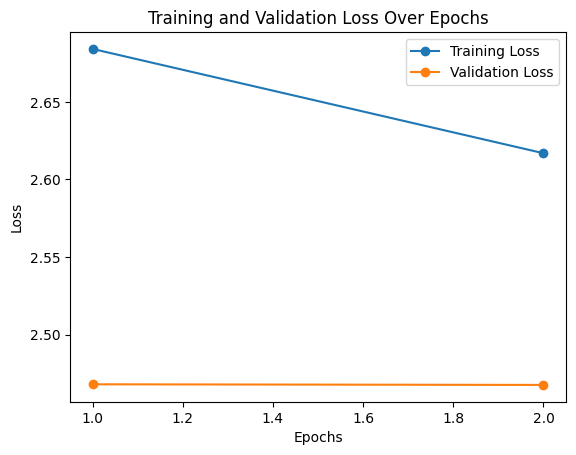

In [74]:
import matplotlib.pyplot as plt

epochs = [1, 2]
training_loss = [2.684100, 2.616900]
validation_loss = [2.468026, 2.467626]

plt.plot(epochs, training_loss, label='Training Loss', marker='o')
plt.plot(epochs, validation_loss, label='Validation Loss', marker='o')

plt.title('Training and Validation Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


**Visualizations**

In [80]:
!pip install -q evaluate
!pip install -q rouge-score

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.1/84.1 kB 1.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done


In [97]:
# Cosine similarity for [0:3] records
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.model_selection import train_test_split

# Initialize lists to store Rouge scores and cosine similarity scores
rouge1_scores = []
rouge2_scores = []
rougeL_scores = []
rougeLsum_scores = []
cosine_similarity_scores = []

# Iterate through each row in the test DataFrame
for index, row in test_df_new[0:3].iterrows():

    query_and_docs = row['orig']

    # Tokenize and generate output
    encoded_query = tokenizer(query_and_docs, truncation=True, padding=True, return_tensors="pt")
    test_output_ids = model.generate(encoded_query['input_ids'])

    # Decode the generated output
    prediction = tokenizer.decode(test_output_ids[0], skip_special_tokens=True, clean_up_tokenization_spaces=False)

    # Compute Rouge scores
    rouge_scores = rouge.compute(predictions=[prediction], references=[row['target']])

    # Append the Rouge scores to the lists
    test_df_new.at[index, 'prediction'] = prediction
    test_df_new.at[index, 'rouge1_scores'] = rouge_scores['rouge1']
    test_df_new.at[index, 'rouge2_scores'] = rouge_scores['rouge2']
    test_df_new.at[index, 'rougeL_scores'] = rouge_scores['rougeL']
    test_df_new.at[index, 'rougeLsum_scores'] = rouge_scores['rougeLsum']

    # Calculate cosine similarity between 'target' and 'prediction'
    vectorizer = CountVectorizer().fit([row['target'], prediction])
    X = vectorizer.transform([row['target'], prediction])
    cosine_similarity_score = cosine_similarity(X)[0, 1]
    test_df_new.at[index, 'cosine_similarity_score'] = cosine_similarity_score

    question = row['orig'].split('context:')[0].strip()
    test_df_new.at[index, 'question'] = question

    answer_length = len(row['target'])
    test_df_new.at[index, 'gold_answer_length'] = answer_length

    if answer_length > 500:
      complexity_label = 'complex'
    else:
      complexity_label = 'simple'
    test_df_new.at[index, 'question_complexity'] = complexity_label

    #question_length = len(row['question'])
    #test_df_new.at[index, 'question_length'] = question_length



# Display the DataFrame with Rouge scores and cosine similarity scores
test_df_new[0:3]


,orig,target,prediction,rouge1_scores,rouge2_scores,rougeL_scores,rougeLsum_scores,cosine_similarity_score,question,gold_answer_length,question_complexity
0,question: How did the first skeletal structure...,"answer: Depends what you mean by ""skeletal"". S...",a,0.000000,0.0,0.000000,0.000000,0.000000,question: How did the first skeletal structure...,115.0,simple
1,question: How did dinosaurs sleep? context: F...,answer: Maybe something is answered here: [Evo...,with their heads tucked under their arms,0.000000,0.0,0.000000,0.000000,0.000000,question: How did dinosaurs sleep?,801.0,complex
2,question: when the tide on rivers goes out/dow...,answer: The other side of the earth. It's lik...,"lessening the stream for above a mile, near two",0.019293,0.0,0.012862,0.012862,0.277441,question: when the tide on rivers goes out/dow...,1499.0,complex


In [107]:
test_df_new = pd.read_csv('/content/drive/MyDrive/W266_Project/test_df_new_dec7.csv')
test_df_new[0:1000]

,Unnamed: 0,orig,target,rouge1_scores,rouge2_scores,rougeL_scores,rougeLsum_scores,prediction,cosine_similarity_score,Ground_Ans_length,question,gold_answer_length,question_length,question_complexity
0,0,question: why is it that most people get more ...,answer: Movies and television have desensitize...,0.002374,0.000000,0.002374,0.002374,animals have no language,0.129910,13815.0,question: why is it that most people get more ...,13815.0,130.0,complex
1,1,question: Do humans actually produce pheromone...,answer: There's not a lot of great evidence su...,0.003922,0.000000,0.003922,0.003922,mammals,0.021879,3210.0,question: Do humans actually produce pheromone...,3210.0,71.0,complex
2,2,question: how does a copier or printer grab on...,"answer: The wheels are bade of rubber, and the...",0.013699,0.000000,0.013699,0.013699,a large sharpened steel blade,0.000000,718.0,question: how does a copier or printer grab on...,718.0,67.0,complex
3,3,question: Can anyone explain how someone can b...,answer: There's always a portion of the popula...,0.022222,0.000000,0.016667,0.022222,researchers have made progress towards underst...,0.123870,1966.0,question: Can anyone explain how someone can b...,1966.0,83.0,complex
4,4,question: Why did some Russians join the Nazis...,answer: Nazi theory and practice differed grea...,0.038732,0.003534,0.028169,0.031690,one of Hitler's ambitions at the start of Worl...,0.426486,3341.0,question: Why did some Russians join the Nazis...,3341.0,72.0,complex
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,995,question: In the context of the formation of s...,"answer: There is, in fact, a critical point at...",0.000000,0.000000,0.000000,0.000000,False,0.000000,1299.0,question: In the context of the formation of s...,1299.0,NaN,complex
996,996,question: why did apple change their standard ...,"answer: 2 reasons.\n\nFirst, the new charger i...",0.085714,0.000000,0.057143,0.057143,so that the batteries draw less energy from th...,0.253546,334.0,question: why did apple change their standard ...,334.0,NaN,simple
997,997,question: why is it ok to draw muhammad becaus...,answer: It isn't illegal to burn a US flag. N...,0.032258,0.000000,0.022581,0.025806,"if people draw pictures of Muhammad, radical I...",0.299525,3344.0,question: why is it ok to draw muhammad becaus...,3344.0,NaN,complex
998,998,question: how do philosophers affect humanity?...,answer: Philosophy deals with what it means to...,0.020513,0.006861,0.013675,0.020513,focusing on resolving existential questions ab...,0.216120,3292.0,question: how do philosophers affect humanity?,3292.0,NaN,complex


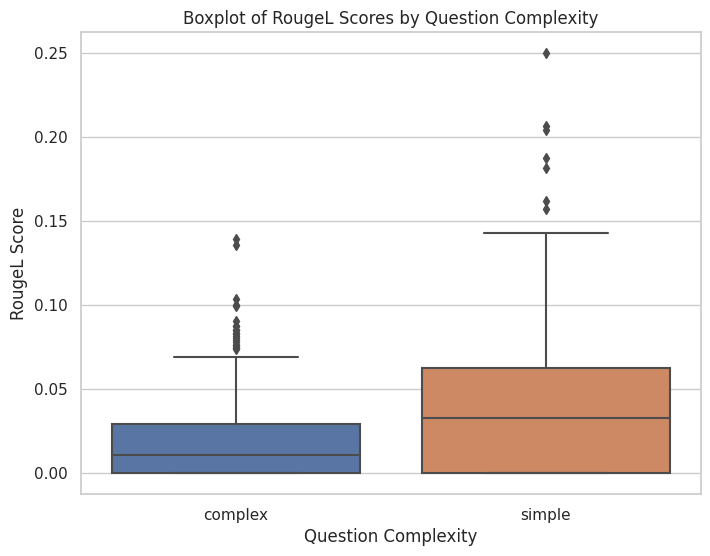

In [108]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming train_df already contains the 'question_complexity' and 'rougeL_scores' columns

# Create a boxplot for RougeL scores based on question complexity
plt.figure(figsize=(8, 6))
sns.boxplot(x='question_complexity', y='rougeL_scores', data=test_df_new[0:1000])
plt.title('Boxplot of RougeL Scores by Question Complexity')
plt.xlabel('Question Complexity')
plt.ylabel('RougeL Score')

# Show the plot
plt.show()


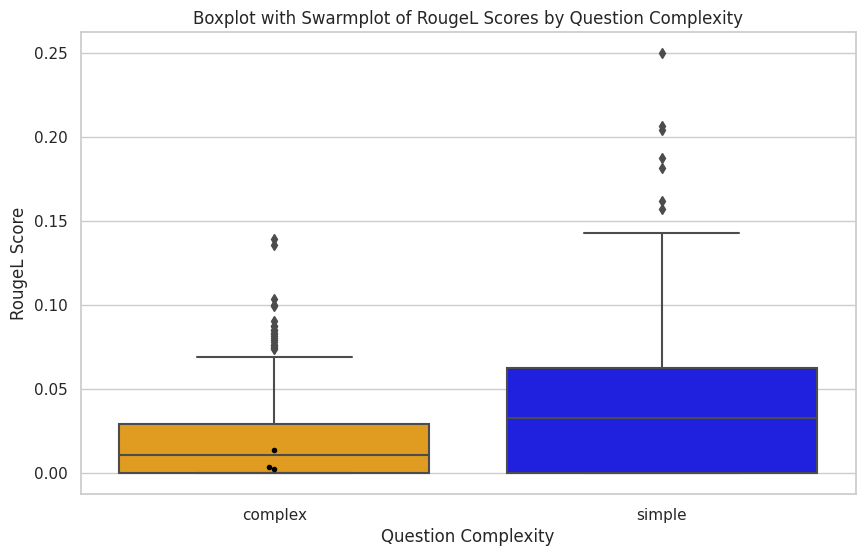

In [109]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming train_df already contains the 'question_complexity' and 'rougeL_scores' columns

# Create a boxplot with swarmplot overlay for RougeL scores based on question complexity
plt.figure(figsize=(10, 6))
sns.boxplot(x='question_complexity', y='rougeL_scores', data=test_df_new[0:1000], palette={'simple': 'blue', 'complex': 'orange'})
sns.swarmplot(x='question_complexity', y='rougeL_scores', data=test_df_new[0:3], color='black', size=4)

plt.title('Boxplot with Swarmplot of RougeL Scores by Question Complexity')
plt.xlabel('Question Complexity')
plt.ylabel('RougeL Score')

# Show the plot
plt.show()


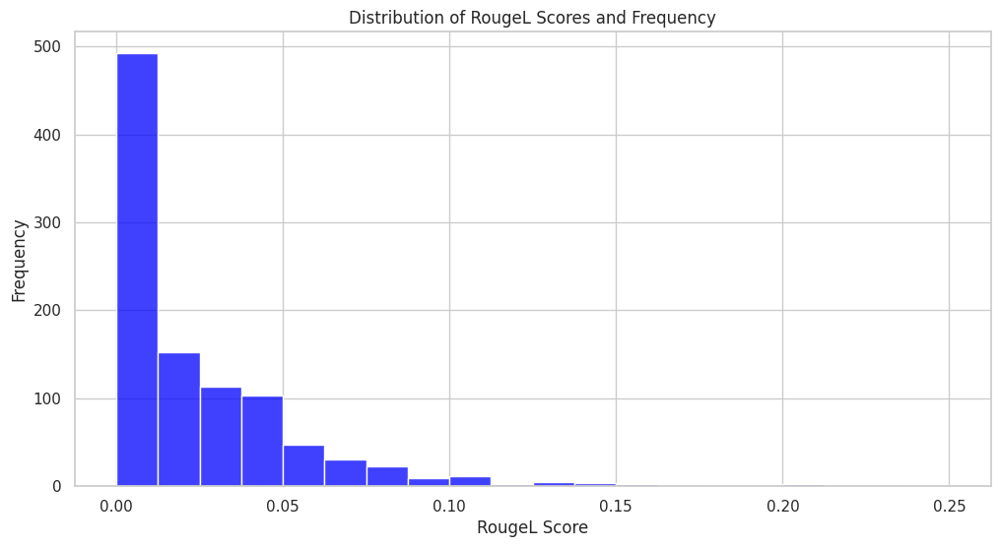

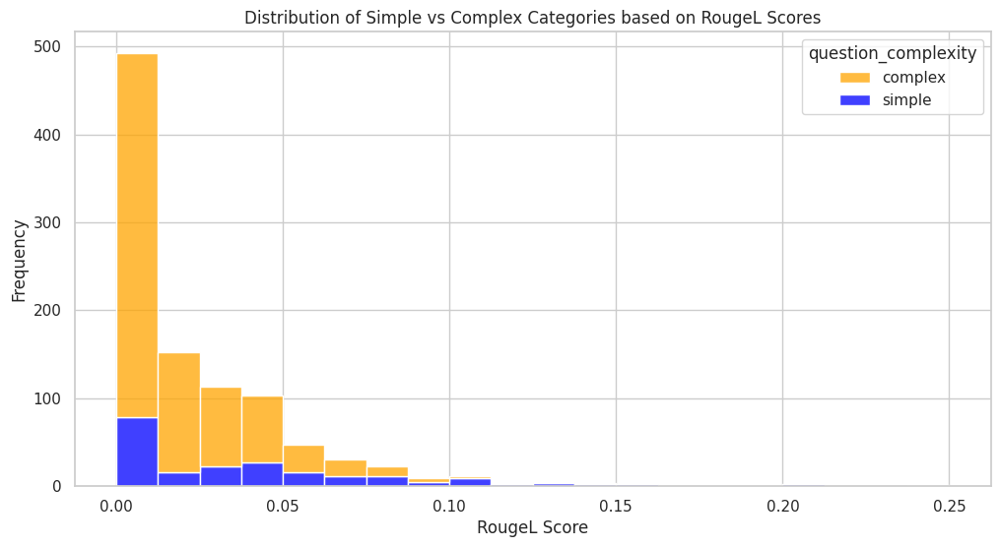

In [111]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming train_df already contains the 'question_complexity' and 'rougeL_scores' columns

# Create a bar plot for RougeL scores and their frequency
plt.figure(figsize=(12, 6))
sns.histplot(data=test_df_new[0:1000], x='rougeL_scores', bins=20, kde=False, color='blue')
plt.title('Distribution of RougeL Scores and Frequency')
plt.xlabel('RougeL Score')
plt.ylabel('Frequency')

# Create a bar plot for 'Simple' vs 'Complex' categories based on RougeL scores
plt.figure(figsize=(12, 6))
sns.histplot(data=test_df_new[0:1000], x='rougeL_scores', hue='question_complexity', multiple='stack', bins=20, palette={'simple': 'blue', 'complex': 'orange'})
plt.title('Distribution of Simple vs Complex Categories based on RougeL Scores')
plt.xlabel('RougeL Score')
plt.ylabel('Frequency')

# Show the plots
plt.show()


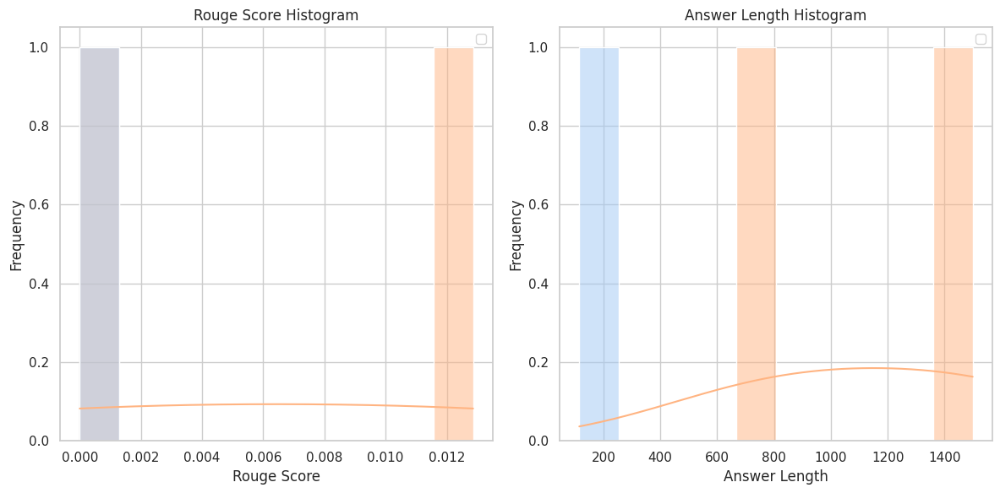

In [103]:
# Important Graph

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming you have a DataFrame named 'df' with columns 'answer_category', 'rouge_score', and 'answer_length'
# Replace 'df' with the actual name of your DataFrame

# Sample DataFrame
## data = {
##    'answer_category': ['simple', 'complex', 'simple', 'complex', 'simple', 'complex'],
##    'rouge_score': [0.2, 0.6, 0.3, 0.55, 0.15, 0.48],
##    'answer_length': [5, 8, 6, 7, 4, 9]
##}


## data = {test_df_new[0:3]['question_complexity'] , test_df_new[0:3]['rougeL_scores'] , test_df_new[0:3]['gold_answer_length']}

## df = pd.DataFrame(data)

# Set the style for the plot
sns.set(style="whitegrid")

# Plotting histograms
plt.figure(figsize=(12, 6))

# Rouge Score Histogram
plt.subplot(1, 2, 1)
sns.histplot(data=test_df_new[0:3], x='rougeL_scores', hue='question_complexity', kde=True, bins=10, palette='pastel')
plt.title('Rouge Score Histogram')
plt.xlabel('Rouge Score')
plt.ylabel('Frequency')
plt.legend()

# Answer Length Histogram
plt.subplot(1, 2, 2)
sns.histplot(data=test_df_new[0:3], x='gold_answer_length', hue='question_complexity', kde=True, bins=10, palette='pastel')
plt.title('Answer Length Histogram')
plt.xlabel('Answer Length')
plt.ylabel('Frequency')
plt.legend()

plt.tight_layout()
plt.show()


In [104]:
# Cosine similarity for [0:1000] records - for more columns
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.model_selection import train_test_split

# Initialize lists to store Rouge scores and cosine similarity scores
rouge1_scores = []
rouge2_scores = []
rougeL_scores = []
rougeLsum_scores = []
cosine_similarity_scores = []

# Iterate through each row in the test DataFrame
for index, row in test_df_new[0:1000].iterrows():

    query_and_docs = row['orig']

    # Tokenize and generate output
    encoded_query = tokenizer(query_and_docs, truncation=True, padding=True, return_tensors="pt")
    test_output_ids = model.generate(encoded_query['input_ids'])

    # Decode the generated output
    prediction = tokenizer.decode(test_output_ids[0], skip_special_tokens=True, clean_up_tokenization_spaces=False)

    # Compute Rouge scores
    rouge_scores = rouge.compute(predictions=[prediction], references=[row['target']])

    # Append the Rouge scores to the lists
    test_df_new.at[index, 'prediction'] = prediction
    test_df_new.at[index, 'rouge1_scores'] = rouge_scores['rouge1']
    test_df_new.at[index, 'rouge2_scores'] = rouge_scores['rouge2']
    test_df_new.at[index, 'rougeL_scores'] = rouge_scores['rougeL']
    test_df_new.at[index, 'rougeLsum_scores'] = rouge_scores['rougeLsum']

    # Calculate cosine similarity between 'target' and 'prediction'
    vectorizer = CountVectorizer().fit([row['target'], prediction])
    X = vectorizer.transform([row['target'], prediction])
    cosine_similarity_score = cosine_similarity(X)[0, 1]
    test_df_new.at[index, 'cosine_similarity_score'] = cosine_similarity_score

    question = row['orig'].split('context:')[0].strip()
    test_df_new.at[index, 'question'] = question

    # question_length = len(row['question'])
    # test_df_new.at[index, 'question_length'] = question_length

    answer_length = len(row['target'])
    test_df_new.at[index, 'gold_answer_length'] = answer_length

    if answer_length > 500:
      complexity_label = 'complex'
    else:
      complexity_label = 'simple'
    test_df_new.at[index, 'question_complexity'] = complexity_label



# Display the DataFrame with Rouge scores and cosine similarity scores
test_df_new[0:1000]


/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1273: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


KeyboardInterrupt: ignored

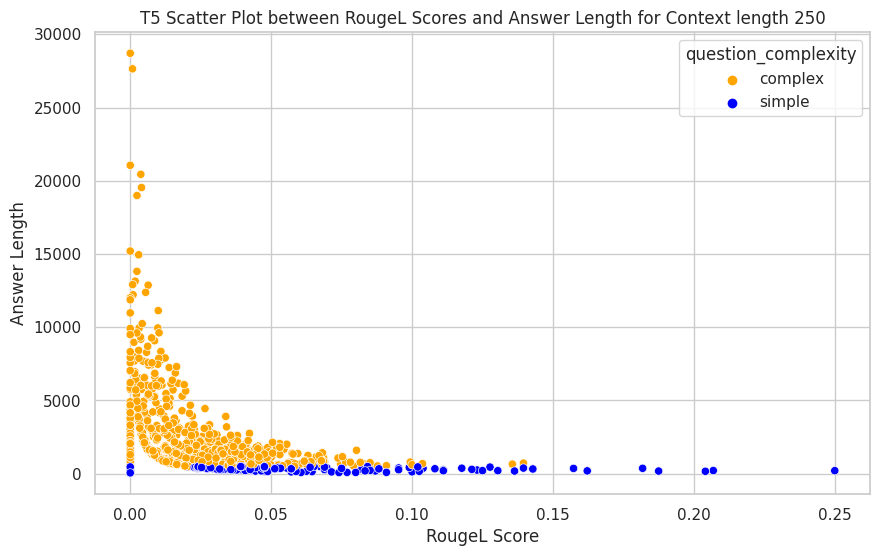

In [113]:
# Very good graph
# T5 Scatter Plot between RougeL Scores and Answer length for Context length 250

import seaborn as sns
import matplotlib.pyplot as plt

# Assuming test_df_new already contains the 'rougeL_scores' and 'gold_answer_length' columns

plt.figure(figsize=(10, 6))
sns.scatterplot(x='rougeL_scores', y='gold_answer_length', data=test_df_new[0:1000], hue='question_complexity', palette={'simple': 'blue', 'complex': 'orange'})
plt.title('T5 Scatter Plot between RougeL Scores and Answer Length for Context length 250')
plt.xlabel('RougeL Score')
plt.ylabel('Answer Length')

# Show the plot
plt.show()


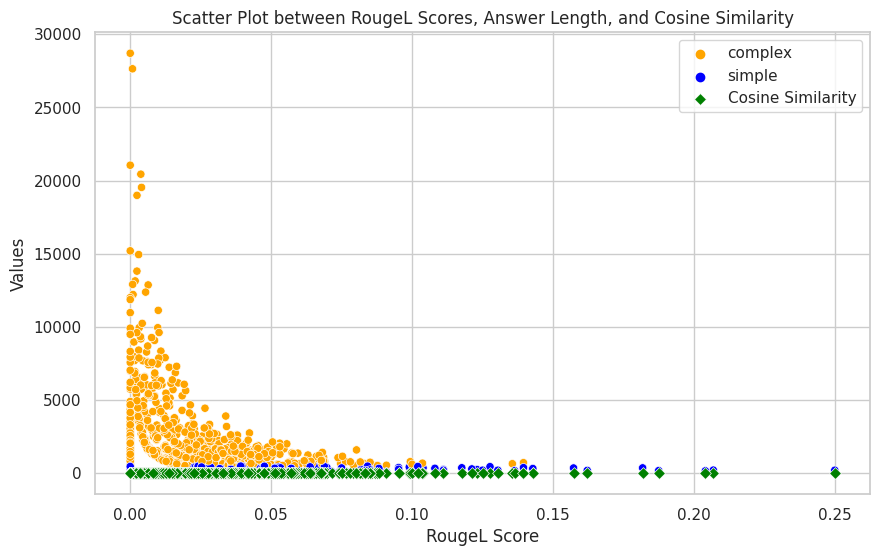

In [115]:
# T5 Scatter Plot between RougeL Scores, Cosine Similarity and Answer length for Context length 250

import seaborn as sns
import matplotlib.pyplot as plt

# Assuming test_df_new already contains the 'rougeL_scores', 'gold_answer_length', and 'cosine_similarity_score' columns

plt.figure(figsize=(10, 6))

# Scatter plot for RougeL scores and answer length
sns.scatterplot(x='rougeL_scores', y='gold_answer_length', data=test_df_new[0:1000], hue='question_complexity', palette={'simple': 'blue', 'complex': 'orange'})

# Scatter plot for RougeL scores and cosine similarity
sns.scatterplot(x='rougeL_scores', y='cosine_similarity_score', data=test_df_new[0:1000], color='green', marker='D', label='Cosine Similarity')

plt.title('Scatter Plot between RougeL Scores, Answer Length, and Cosine Similarity')
plt.xlabel('RougeL Score')
plt.ylabel('Values')
plt.legend()

# Show the plot
plt.show()


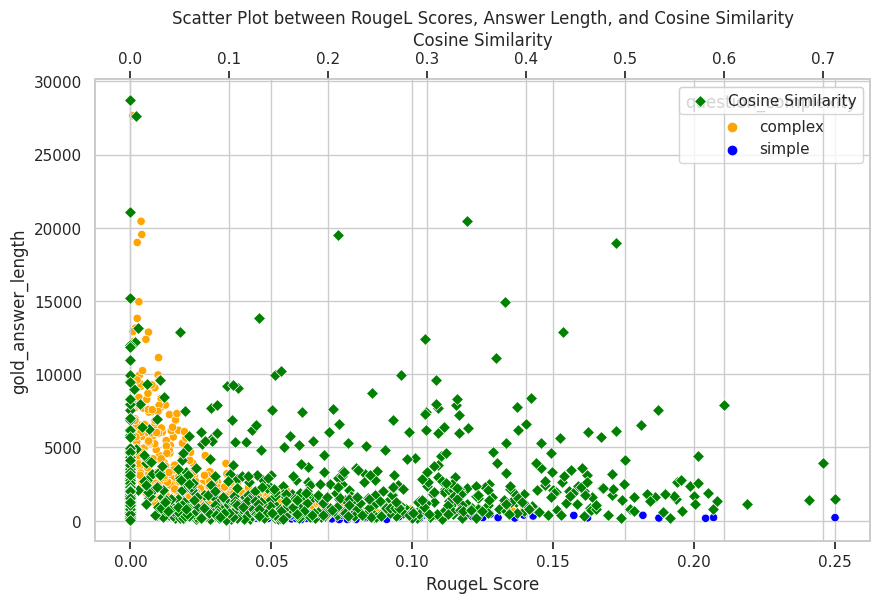

In [121]:
## Very Important Graph
# T5 RougeL score (circles) & Cosine Similarity (circles) with Answer Length on different scales

import seaborn as sns
import matplotlib.pyplot as plt

# Assuming test_df_new already contains the 'rougeL_scores', 'gold_answer_length', and 'cosine_similarity_score' columns

# Create a dual-axis plot
fig, ax1 = plt.subplots(figsize=(10, 6))

# Scatter plot for RougeL scores and answer length
sns.scatterplot(x='rougeL_scores', y='gold_answer_length', data=test_df_new[0:1000], hue='question_complexity', palette={'simple': 'blue', 'complex': 'orange'}, ax=ax1)

# Create a secondary x-axis for cosine similarity
ax2 = ax1.twiny()
sns.scatterplot(x='cosine_similarity_score', y='gold_answer_length', data=test_df_new[0:1000], color='green', marker='D', label='Cosine Similarity', ax=ax2)

# Set labels for the axes
ax1.set_xlabel('RougeL Score')
ax2.set_xlabel('Cosine Similarity')

# Show the plot
plt.title('Scatter Plot between RougeL Scores, Answer Length, and Cosine Similarity')
plt.ylabel('Values')
plt.legend()
plt.show()


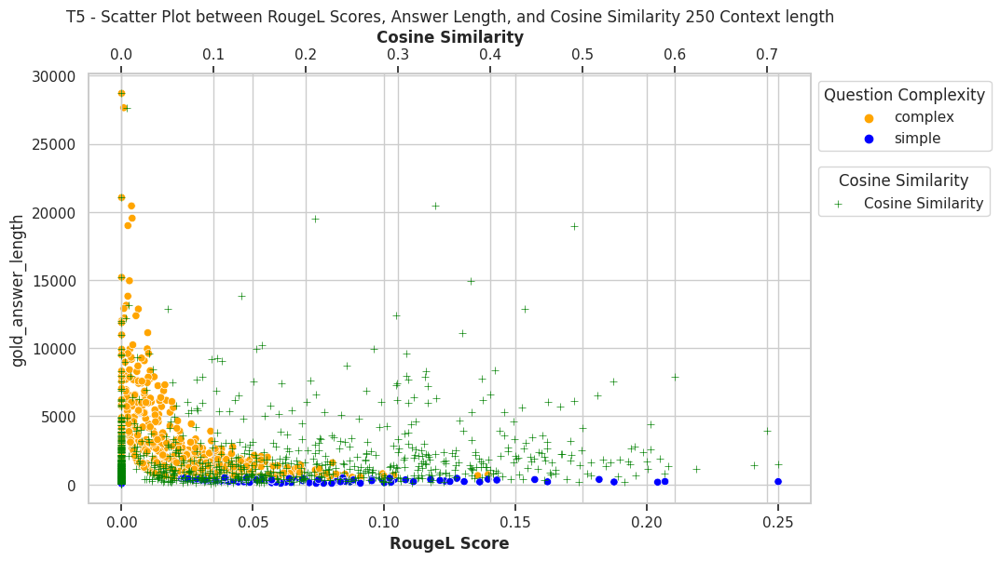

In [128]:
# T5 RougeL score (circles) & Cosine Similarity (cross) with Answer Length on different scales

import seaborn as sns
import matplotlib.pyplot as plt

# Assuming test_df_new already contains the 'rougeL_scores', 'gold_answer_length', and 'cosine_similarity_score' columns

# Create a dual-axis plot
fig, ax1 = plt.subplots(figsize=(10, 6))

# Scatter plot for RougeL scores and answer length
sns.scatterplot(x='rougeL_scores', y='gold_answer_length', data=test_df_new[0:1000], hue='question_complexity', palette={'simple': 'blue', 'complex': 'orange'}, ax=ax1)

# Create a secondary x-axis for cosine similarity
ax2 = ax1.twiny()
sns.scatterplot(x='cosine_similarity_score', y='gold_answer_length', data=test_df_new[0:1000], color='green', marker='+', label='Cosine Similarity', ax=ax2)

# Set labels for the axes
ax1.set_xlabel('RougeL Score' , weight='bold')
ax2.set_xlabel('Cosine Similarity', weight='bold')

# Move the legend outside the plot area
# ax1.legend(loc='upper left', bbox_to_anchor=(1, 1))

# Move the legend outside the plot area with titles
ax1.legend(title='Question Complexity', loc='upper left', bbox_to_anchor=(1, 1))
ax2.legend(title='Cosine Similarity', loc='upper left', bbox_to_anchor=(1, 0.8))


# Show the plot
plt.title('T5 - Scatter Plot between RougeL Scores, Answer Length, and Cosine Similarity 250 Context length')
plt.ylabel('Values')
plt.show()


In [132]:
# test_df_new[0:1000].to_csv('t1_test_df_new.csv')

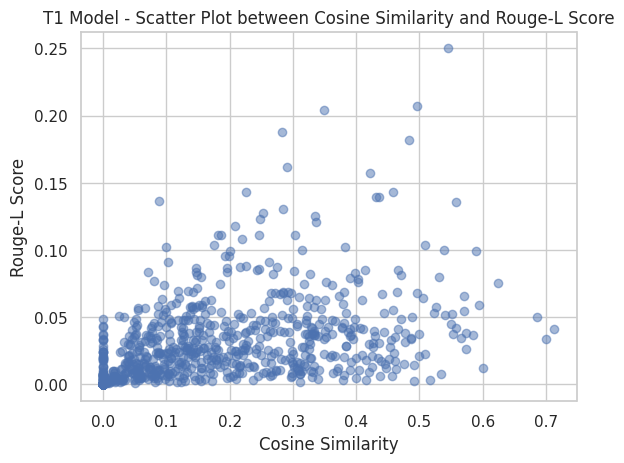

In [134]:
# Relation between RougeL and Cosine similarity
import matplotlib.pyplot as plt

# Assuming 'cosine_similarity_score' and 'rouge1_scores' are the column names
cosine_similarity = test_df_new[0:1000]['cosine_similarity_score']
rouge1_scores = test_df_new[0:1000]['rougeL_scores']

# Create a scatter plot
plt.scatter(cosine_similarity, rouge1_scores, alpha=0.5)
plt.title('T1 Model - Scatter Plot between Cosine Similarity and Rouge-L Score')
plt.xlabel('Cosine Similarity')
plt.ylabel('Rouge-L Score')
plt.show()


In [136]:
# Checking question answers where the cosine similarity is high but RougeL score is low

test_df_new[(test_df_new['cosine_similarity_score'] > 0.7) & (test_df_new['rougeL_scores'] < 0.05)]

,Unnamed: 0,orig,target,rouge1_scores,rouge2_scores,rougeL_scores,rougeLsum_scores,prediction,cosine_similarity_score,Ground_Ans_length,question,gold_answer_length,question_length,question_complexity
49,49,question: Did the Armenians partake in partisa...,answer: TLDR: Ottomans reforms in the mid 19th...,0.043143,0.027821,0.033898,0.033898,The outbreak of World War I led to confrontati...,0.700578,3910.0,question: Did the Armenians partake in partisa...,3910.0,NaN,complex
961,961,question: why do dams need spillways? why can'...,answer: Free flowing water over the top of a d...,0.041522,0.020906,0.041522,0.041522,to regulate the top portion of the dam,0.712466,1484.0,question: why do dams need spillways? why can'...,1484.0,NaN,complex


In [137]:
print("\n question and context:" , test_df_new.iloc[49]['orig'])

print("\n ground label answer:" , test_df_new.iloc[49]['target'])

print("\n predicted answer:" , test_df_new.iloc[49]['prediction'])

print("\n cosine_similarity answer:" , test_df_new.iloc[49]['cosine_similarity_score'])


 question and context: question: Did the Armenians partake in partisan activities against the Ottoman government during WW1, as claimed by some? context:  In 1909 the Armenians of the Ottoman Empire had high expectations from the Young Turk movement which brought Abdul Hamid's regime to an end. Yet during the opening months of the First World War, there were mass arrests, deportations, and massacres of Armenians living in Eastern Anatolia. During this time, Lepsius founded humanitarian relief activities, and tried (unsuccessfully) to influence Germany, the Ottoman Empire's ally, which had thousands of soldiers and officers stationed throughout the Ottoman Empire. According to Ernst Jaeckh "At the time of World War I he introduced the Armenian protagonist. Dr. Lepsius, to the Turkish Generalissimo Enver Pasha, and through the author's [Jaeckh's] intervention the lives of many Armenians, particularly women and children, were saved."
 The outbreak of World War I led to confrontation betw

**Comparision between Aruna's T5 and Gene's Bart work**

In [171]:
test_df_new = pd.read_csv("/content/drive/MyDrive/W266_Project/T5_test_df_new_250_Context.csv")

In [144]:
bart_df = pd.read_csv('/content/drive/MyDrive/W266_Project/BART_rouge_evaluation.csv')

In [145]:
bart_df.columns

Index(['Unnamed: 0.1', 'Unnamed: 0', 'predicted', 'reference', 'rougeL_P',
       'rougeL_R', 'rougeL_F', 'Cosine_Sim', 'Ans_length', 'length_range'],
      dtype='object')

In [146]:
bart_df[0:1]

,Unnamed: 0.1,Unnamed: 0,predicted,reference,rougeL_P,rougeL_R,rougeL_F,Cosine_Sim,Ans_length,length_range
0,0,0,['answer: Chemiluminescence is the emission of...,['answer: <P> Light is given off by electrons...,0.22807,0.188406,0.206349,0.626704,392,"[300.0, 400.0)"


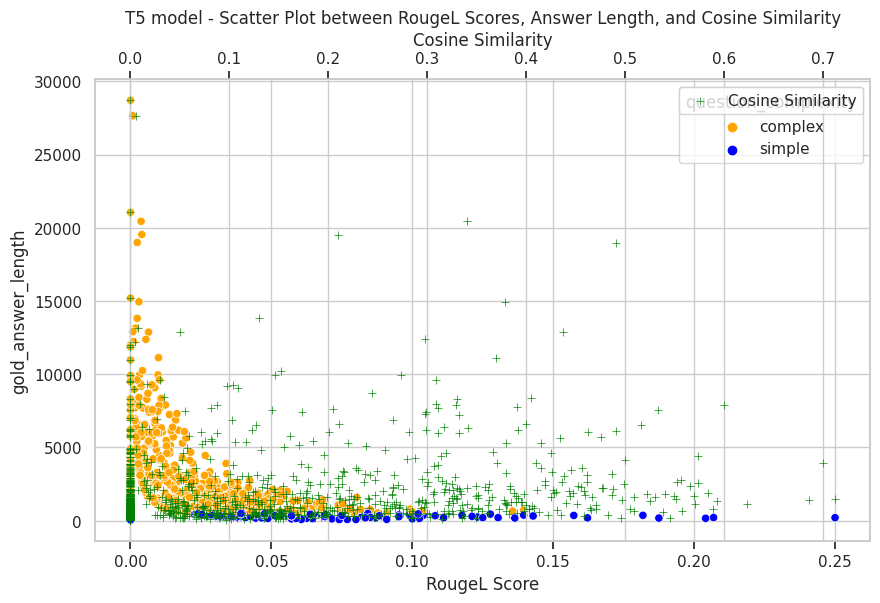

In [147]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming test_df_new already contains the 'rougeL_scores', 'gold_answer_length', and 'cosine_similarity_score' columns

# Create a dual-axis plot
fig, ax1 = plt.subplots(figsize=(10, 6))

# Scatter plot for RougeL scores and answer length
sns.scatterplot(x='rougeL_scores', y='gold_answer_length', data=test_df_new[0:1000], hue='question_complexity', palette={'simple': 'blue', 'complex': 'orange'}, ax=ax1)

# Create a secondary x-axis for cosine similarity
ax2 = ax1.twiny()
sns.scatterplot(x='cosine_similarity_score', y='gold_answer_length', data=test_df_new[0:1000], color='green', marker='+', label='Cosine Similarity', ax=ax2)

# Set labels for the axes
ax1.set_xlabel('RougeL Score')
ax2.set_xlabel('Cosine Similarity')

# Show the plot
plt.title('T5 model - Scatter Plot between RougeL Scores, Answer Length, and Cosine Similarity')
plt.ylabel('Values')
plt.legend()
plt.show()

In [153]:
# bart_df['question_complexity'] = bart_df['Ans_length'].apply(lambda x: 'simple' if x < 400 else 'complex')

In [149]:
bart_df.columns

Index(['Unnamed: 0.1', 'Unnamed: 0', 'predicted', 'reference', 'rougeL_P',
       'rougeL_R', 'rougeL_F', 'Cosine_Sim', 'Ans_length', 'length_range',
       'question_complexity'],
      dtype='object')

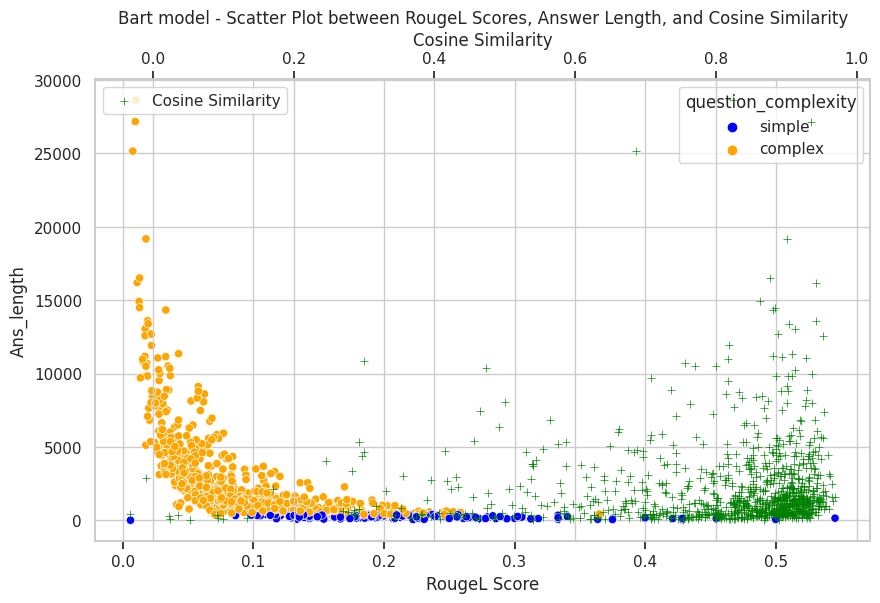

In [155]:
# Bart Model - RougeL score and Cosine Similarity with Answer length

import seaborn as sns
import matplotlib.pyplot as plt

# Assuming test_df_new already contains the 'rougeL_scores', 'gold_answer_length', and 'cosine_similarity_score' columns

# Create a dual-axis plot
fig, ax1 = plt.subplots(figsize=(10, 6))

# Scatter plot for RougeL scores and answer length
sns.scatterplot(x='rougeL_R', y='Ans_length', data=bart_df[0:1000], hue='question_complexity', palette={'simple': 'blue', 'complex': 'orange'}, ax=ax1)

# Create a secondary x-axis for cosine similarity
ax2 = ax1.twiny()
sns.scatterplot(x='Cosine_Sim', y='Ans_length', data=bart_df[0:1000], color='green', marker='+', label='Cosine Similarity', ax=ax2)

# Set labels for the axes
ax1.set_xlabel('RougeL Score')
ax2.set_xlabel('Cosine Similarity')

# Show the plot
plt.title('Bart model - Scatter Plot between RougeL Scores, Answer Length, and Cosine Similarity')
plt.ylabel('Values')
plt.legend()
plt.show()



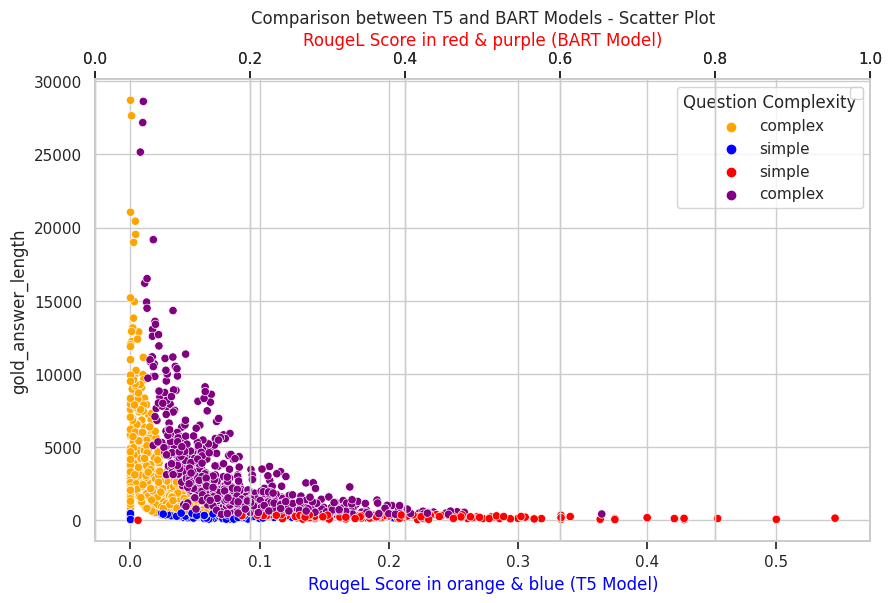

In [156]:
# Aruna and Gene's work to compare RougeL T5 and Bart model

import seaborn as sns
import matplotlib.pyplot as plt

# Assuming test_df_new contains columns from both T5 and BART models

# Create a dual-axis plot
fig, ax1 = plt.subplots(figsize=(10, 6))

# Scatter plot for T5 model - RougeL scores and answer length
sns.scatterplot(x='rougeL_scores', y='gold_answer_length', data=test_df_new[0:1000], hue='question_complexity', palette={'simple': 'blue', 'complex': 'orange'}, ax=ax1)

# Create a secondary x-axis for T5 model - cosine similarity
ax2 = ax1.twiny()
# sns.scatterplot(x='cosine_similarity_score', y='gold_answer_length', data=test_df_new[0:1000], color='green', marker='+', label='T5 - Cosine Similarity', ax=ax2)

# Scatter plot for BART model - RougeL scores and answer length
sns.scatterplot(x='rougeL_R', y='Ans_length', data=bart_df[0:1000], hue='question_complexity', palette={'simple': 'red', 'complex': 'purple'}, ax=ax1)

# Scatter plot for BART model - cosine similarity
ax3 = ax1.twiny()
# sns.scatterplot(x='Cosine_Sim', y='Ans_length', data=bart_df[0:1000], color='orange', marker='x', label='BART - Cosine Similarity', ax=ax3)

# Set labels for the axes
ax1.set_xlabel('RougeL Score in orange & blue (T5 Model)', color='blue')
# ax2.set_xlabel('Cosine Similarity (T5 Model)', color='green')
ax3.set_xlabel('RougeL Score in red & purple (BART Model)', color='red')

# Place the legend inside the plot area with titles
legend_labels = {'simple': 'T5 - Simple', 'complex': 'T5 - Complex','red': 'BART - Simple question', 'purple': 'BART - Complex question', 'blue': 'T5 - Complex question', 'orange': 'T5 - Simple question'}

ax1.legend(title='Question Complexity', loc='upper right')
#ax2.legend(title='Cosine Similarity', loc='upper right')

# Show the plot
plt.title('Comparison between T5 and BART Models - Scatter Plot')
plt.ylabel('Values')
plt.legend()
plt.show()


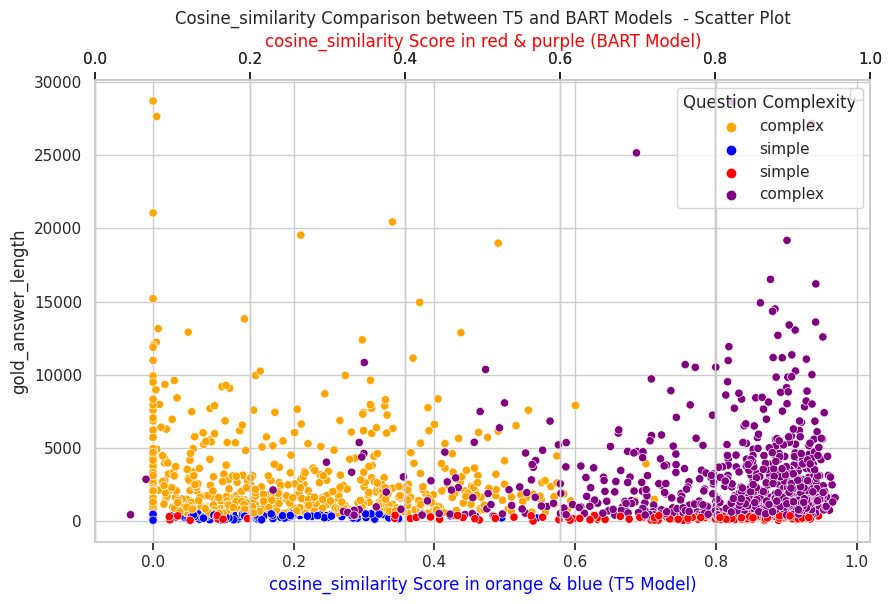

In [158]:
# Aruna and Gene's work to compare Cosine Similarity T5 and Bart model

import seaborn as sns
import matplotlib.pyplot as plt

# Assuming test_df_new contains columns from both T5 and BART models

# Create a dual-axis plot
fig, ax1 = plt.subplots(figsize=(10, 6))

# Scatter plot for T5 model - RougeL scores and answer length
sns.scatterplot(x='cosine_similarity_score', y='gold_answer_length', data=test_df_new[0:1000], hue='question_complexity', palette={'simple': 'blue', 'complex': 'orange'}, ax=ax1)

# Create a secondary x-axis for T5 model - cosine similarity
ax2 = ax1.twiny()
# sns.scatterplot(x='cosine_similarity_score', y='gold_answer_length', data=test_df_new[0:1000], color='green', marker='+', label='T5 - Cosine Similarity', ax=ax2)

# Scatter plot for BART model - RougeL scores and answer length
sns.scatterplot(x='Cosine_Sim', y='Ans_length', data=bart_df[0:1000], hue='question_complexity', palette={'simple': 'red', 'complex': 'purple'}, ax=ax1)

# Scatter plot for BART model - cosine similarity
ax3 = ax1.twiny()
# sns.scatterplot(x='Cosine_Sim', y='Ans_length', data=bart_df[0:1000], color='orange', marker='x', label='BART - Cosine Similarity', ax=ax3)

# Set labels for the axes
ax1.set_xlabel('cosine_similarity Score in orange & blue (T5 Model)', color='blue')
# ax2.set_xlabel('Cosine Similarity (T5 Model)', color='green')
ax3.set_xlabel('cosine_similarity Score in red & purple (BART Model)', color='red')

# Place the legend inside the plot area with titles
legend_labels = {'simple': 'T5 - Simple', 'complex': 'T5 - Complex','red': 'BART - Simple question', 'purple': 'BART - Complex question', 'blue': 'T5 - Complex question', 'orange': 'T5 - Simple question'}

ax1.legend(title='Question Complexity', loc='upper right')
#ax2.legend(title='Cosine Similarity', loc='upper right')

# Show the plot
plt.title('Cosine_similarity Comparison between T5 and BART Models  - Scatter Plot')
plt.ylabel('Values')
plt.legend()
plt.show()


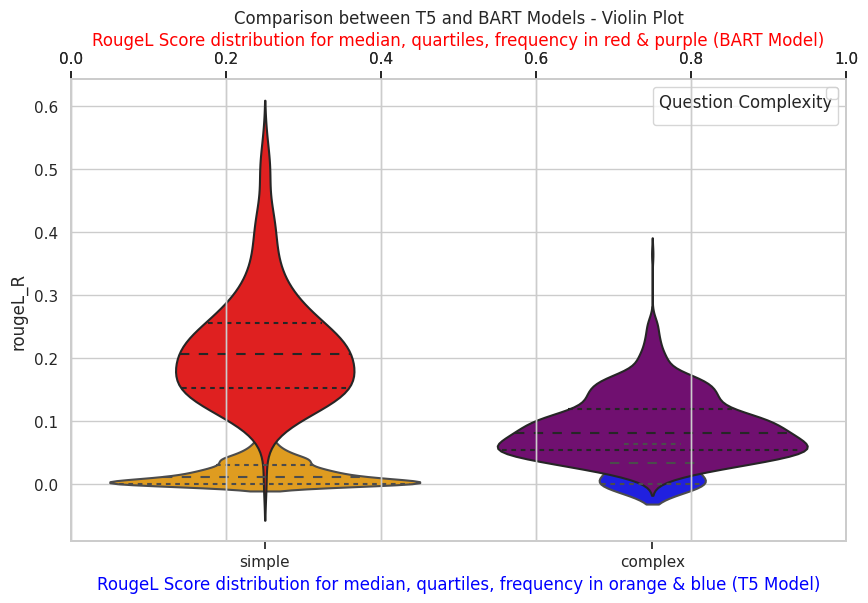

In [159]:
# Aruna and Gene's work to compare RougeL T5 and Bart model and do Statistics on it

import seaborn as sns
import matplotlib.pyplot as plt

# Assuming test_df_new contains columns from both T5 and BART models

# Create a dual-axis plot
fig, ax1 = plt.subplots(figsize=(10, 6))

# Violin plot for T5 model - RougeL scores and answer length
sns.violinplot(x='question_complexity', y='rougeL_scores', data=test_df_new[0:1000], palette={'simple': 'blue', 'complex': 'orange'}, ax=ax1, inner='quartile', split=True)

# Create a secondary x-axis for T5 model - cosine similarity
ax2 = ax1.twiny()
# sns.scatterplot(x='cosine_similarity_score', y='gold_answer_length', data=test_df_new[0:1000], color='green', marker='+', label='T5 - Cosine Similarity', ax=ax2)

# Violin plot for BART model - RougeL scores and answer length
sns.violinplot(x='question_complexity', y='rougeL_R', data=bart_df[0:1000], palette={'simple': 'red', 'complex': 'purple'}, ax=ax1, inner='quartile', split=True)

# Scatter plot for BART model - cosine similarity
ax3 = ax1.twiny()
# sns.scatterplot(x='Cosine_Sim', y='Ans_length', data=bart_df[0:1000], color='orange', marker='x', label='BART - Cosine Similarity', ax=ax3)


# Set labels for the axes
ax1.set_xlabel('RougeL Score distribution for median, quartiles, frequency in orange & blue (T5 Model)', color='blue')
# ax2.set_xlabel('Cosine Similarity (T5 Model)', color='green')
ax3.set_xlabel('RougeL Score distribution for median, quartiles, frequency in red & purple (BART Model)', color='red')


# Set labels for the axes
# ax1.set_xlabel('Question Complexity', color='black')
# ax2.set_xlabel('Cosine Similarity (T5 Model)', color='green')
# ax3.set_xlabel('Question Complexity', color='black')

# Place the legend inside the plot area with titles
legend_labels = {'simple': 'T5 - Simple', 'complex': 'T5 - Complex', 'red': 'BART - Simple question', 'purple': 'BART - Complex question', 'blue': 'T5 - Complex question', 'orange': 'T5 - Simple question'}

ax1.legend(title='Question Complexity', loc='upper right')
# ax2.legend(title='Cosine Similarity', loc='upper right')

# Show the plot
plt.title('Comparison between T5 and BART Models - Violin Plot')
plt.ylabel('RougeL Score')
plt.legend()
plt.show()


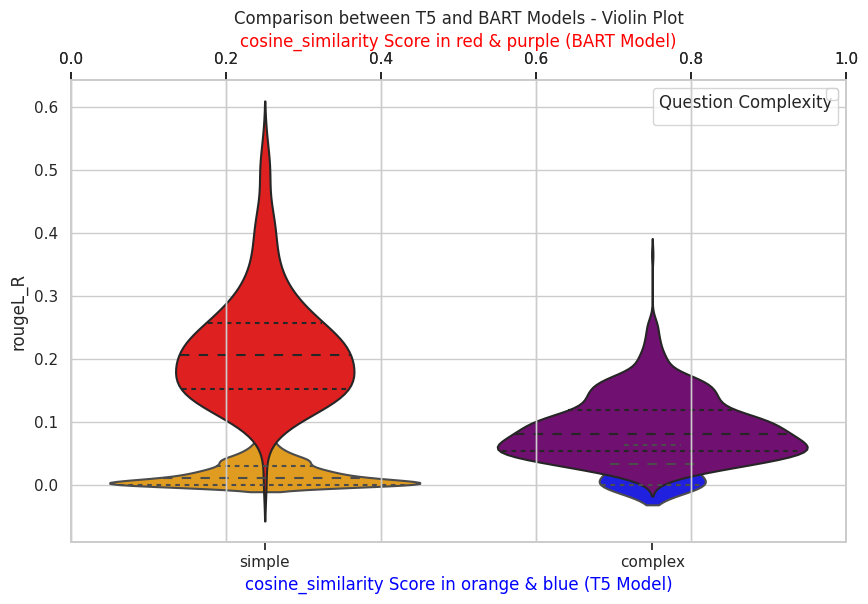

In [161]:
# Aruna and Gene's work to compare Cosine Similarity T5 and Bart model and do Statistics on it

import seaborn as sns
import matplotlib.pyplot as plt

# Assuming test_df_new contains columns from both T5 and BART models

# Create a dual-axis plot
fig, ax1 = plt.subplots(figsize=(10, 6))

# Violin plot for T5 model - RougeL scores and answer length
sns.violinplot(x='question_complexity', y='rougeL_scores', data=test_df_new[0:1000], palette={'simple': 'blue', 'complex': 'orange'}, ax=ax1, inner='quartile', split=True)

# Create a secondary x-axis for T5 model - cosine similarity
ax2 = ax1.twiny()
# sns.scatterplot(x='cosine_similarity_score', y='gold_answer_length', data=test_df_new[0:1000], color='green', marker='+', label='T5 - Cosine Similarity', ax=ax2)

# Violin plot for BART model - RougeL scores and answer length
sns.violinplot(x='question_complexity', y='rougeL_R', data=bart_df[0:1000], palette={'simple': 'red', 'complex': 'purple'}, ax=ax1, inner='quartile', split=True)

# Scatter plot for BART model - cosine similarity
ax3 = ax1.twiny()
# sns.scatterplot(x='Cosine_Sim', y='Ans_length', data=bart_df[0:1000], color='orange', marker='x', label='BART - Cosine Similarity', ax=ax3)


# Set labels for the axes
ax1.set_xlabel('cosine_similarity Score in orange & blue (T5 Model)', color='blue')
# ax2.set_xlabel('Cosine Similarity (T5 Model)', color='green')
ax3.set_xlabel('cosine_similarity Score in red & purple (BART Model)', color='red')


# Set labels for the axes
# ax1.set_xlabel('Question Complexity', color='black')
# ax2.set_xlabel('Cosine Similarity (T5 Model)', color='green')
# ax3.set_xlabel('Question Complexity', color='black')

# Place the legend inside the plot area with titles
legend_labels = {'simple': 'T5 - Simple', 'complex': 'T5 - Complex', 'red': 'BART - Simple question', 'purple': 'BART - Complex question', 'blue': 'T5 - Complex question', 'orange': 'T5 - Simple question'}

ax1.legend(title='Question Complexity', loc='upper right')
# ax2.legend(title='Cosine Similarity', loc='upper right')

# Show the plot
plt.title('Comparison between T5 and BART Models - Violin Plot')
plt.ylabel('RougeL Score')
plt.legend()
plt.show()


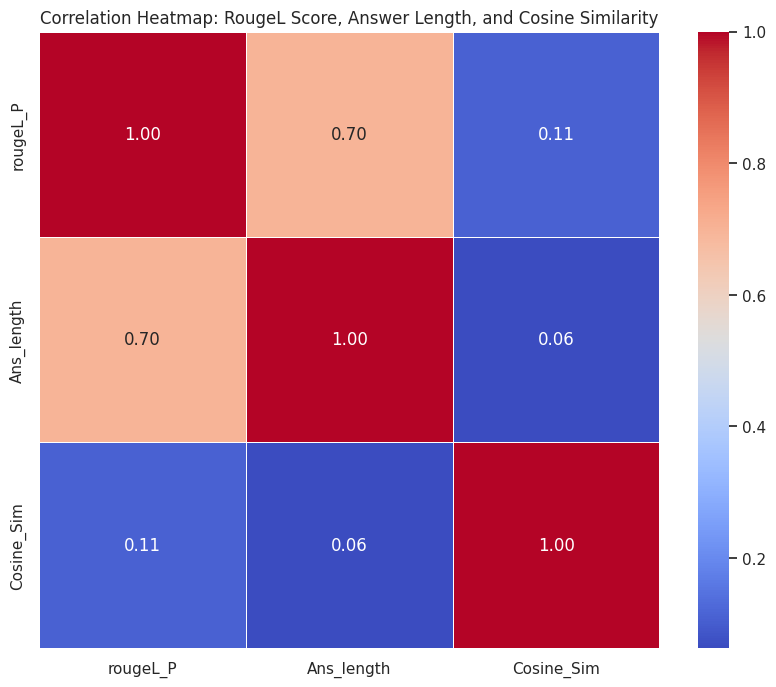

In [164]:
# Gene's Bart model to see the Heat map correlation between RougeL and Cosine Similarity

import seaborn as sns
import matplotlib.pyplot as plt

# Assuming test_df_new already contains the 'rougeL_scores', 'gold_answer_length', and 'cosine_similarity_score' columns

# Calculate the correlation matrix
correlation_matrix = bart_df[['rougeL_P', 'Ans_length', 'Cosine_Sim']].corr()

# Create a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)

# Set labels for the axes
plt.title('Correlation Heatmap: RougeL Score, Answer Length, and Cosine Similarity')
plt.show()


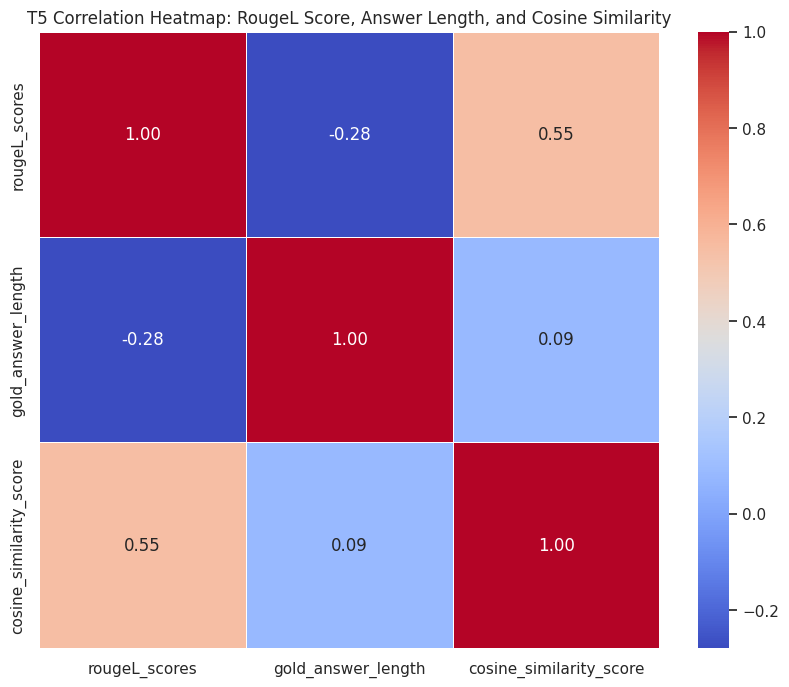

In [165]:
# Aruna's T5 model to see the Heat map correlation between RougeL and Cosine Similarity

import seaborn as sns
import matplotlib.pyplot as plt

# Assuming test_df_new already contains the 'rougeL_scores', 'gold_answer_length', and 'cosine_similarity_score' columns

# Calculate the correlation matrix
correlation_matrix = test_df_new[['rougeL_scores', 'gold_answer_length', 'cosine_similarity_score']].corr()

# Create a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)

# Set labels for the axes
plt.title('T5 Correlation Heatmap: RougeL Score, Answer Length, and Cosine Similarity')
plt.show()


In [ ]:
test_df_new.to_csv("test_df_new_250Context.csv")

In [166]:
test_df_new[0:2]

,Unnamed: 0,orig,target,rouge1_scores,rouge2_scores,rougeL_scores,rougeLsum_scores,prediction,cosine_similarity_score,Ground_Ans_length,question,gold_answer_length,question_length,question_complexity
0,0,question: why is it that most people get more ...,answer: Movies and television have desensitize...,0.002374,0.0,0.002374,0.002374,animals have no language,0.129910,13815.0,question: why is it that most people get more ...,13815.0,130.0,complex
1,1,question: Do humans actually produce pheromone...,answer: There's not a lot of great evidence su...,0.003922,0.0,0.003922,0.003922,mammals,0.021879,3210.0,question: Do humans actually produce pheromone...,3210.0,71.0,complex


**Adam Bart+DPR work**

In [167]:
# This cell will authenticate you and mount your Drive in the Colab.
# from google.colab import drive
# drive.mount('/content/drive')

In [182]:
import pandas as pd

df_test_DPR = pd.read_csv('/content/drive/MyDrive/W266_Project/DPR_Bart_Adam_df_test.csv')

In [183]:
df_test_DPR

,Unnamed: 0.1,Unnamed: 0,q_id,question,context,predicted,label,rougeL_precision_min,rougeL_recall_min,rougeL_fmeasure_min,rougeL_precision_median,rougeL_recall_median,rougeL_fmeasure_median,rougeL_precision_max,rougeL_recall_max,rougeL_fmeasure_max,Ans_length,question_complexity,Question_length
0,0,0,2lun81,question: how does a tide stain removal pen wo...,context: <P> is carefully placed on the water'...,"[""answer: > Where does the salt go?The ink i...",['answer: Obviously to hell where it belongs. ...,[0.08474576],[0.27777778],[0.12987013],[0.08474576],0.277778,[0.12987013],0.084746,0.277778,[0.12987013],112,simple,75
1,1,1,1mh2be,question: How is our body able to create the m...,"context: <P> about four feet, and are tightly ...","['answer: Your nails are made out of keratin, ...",['answer: Hair and nails are composed of [kera...,[0.25581395],[0.2],[0.2244898],[0.25581395],0.200000,[0.2244898],0.255814,0.200000,[0.2244898],637,complex,79
2,2,2,1p03gl,question: dual citizenship,context: <P> dual citizenship. <P> dual citize...,"['answer: I\'m not sure what you mean by ""dual...","[""answer: Some countries allow dual citizenshi...",[0.22105263],[0.1372549],[0.16935484],[0.22105263],0.137255,[0.16935484],0.221053,0.137255,[0.16935484],843,complex,27
3,3,3,5fl6a6,question: why do some of us fell the urge to s...,context: <P> called “a mock with a scornful co...,"['answer: I\'m not sure what you mean by ""we k...","[""answer: Everybody responds to things in thei...",[0.26785714],[0.11627907],[0.16216216],[0.26785714],0.116279,[0.16216216],0.267857,0.116279,[0.16216216],750,complex,183
4,4,4,2gwbix,question: why do we expect organizations like ...,context: <P> might suppose that football playe...,"[""answer: Because the NFL is a business, and t...","['answer: The NFL is a media juggernaut, so on...",[0.26785714],[0.19230769],[0.2238806],[0.26785714],0.192308,[0.2238806],0.267857,0.192308,[0.2238806],462,complex,114
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1245,1245,1245,9kztj5,question: What are some good explorer/adventur...,"context: <P> narrated by Peterson, which detai...","['answer: I\'m not sure what you mean by ""adve...","[""answer: Nellie Bly! Bly was an investigative...",[0.21794872],[0.11038961],[0.14655172],[0.21794872],0.110390,[0.14655172],0.217949,0.110390,[0.14655172],885,complex,72
1246,1246,1246,1kwr7s,question: Why do many physicists seem to assum...,context: <P> to confuse theoretical models wit...,['answer: There is no evidence for the existen...,['answer: One reason is because it is possible...,[0.25490196],[0.09811321],[0.14168937],[0.25490196],0.098113,[0.14168937],0.254902,0.098113,[0.14168937],1630,complex,200
1247,1247,1247,34cjvk,question: how does a physical piece of memory ...,context: <P> Areal density (computer storage) ...,['answer: A hard drive is just a piece of plas...,"[""answer: An actual hard drive has a spinning ...",[0.3030303],[0.12987013],[0.18181818],[0.3030303],0.129870,[0.18181818],0.303030,0.129870,[0.18181818],862,complex,118
1248,1248,1248,f19240,"question: when you turn the ac on, turn the sp...",context: <P> situation that worsens with highe...,"[""answer: If you turn the speakers louder or t...","[""answer: 1 hp is about 750 watts. The alterna...",[0.27272727],[0.14423077],[0.18867925],[0.27272727],0.144231,[0.18867925],0.272727,0.144231,[0.18867925],548,complex,151


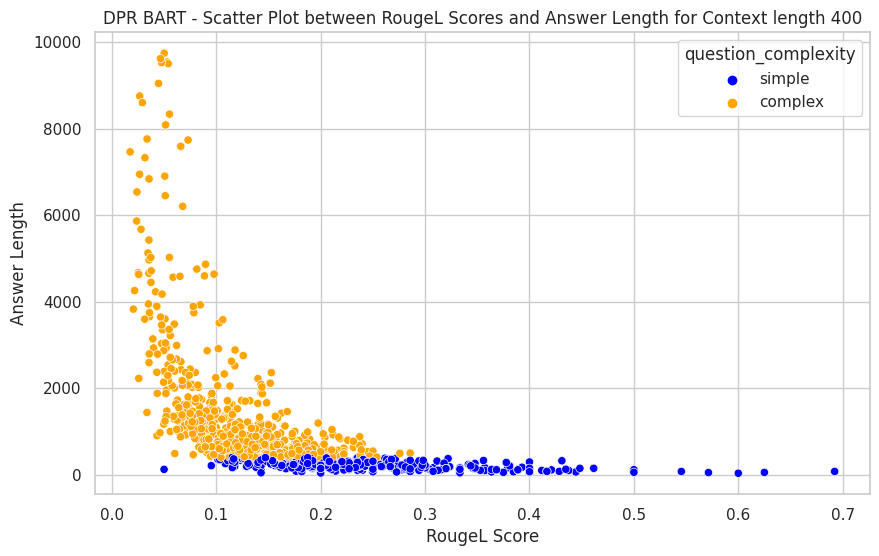

In [184]:
# Very good graph
# DPR BART

import seaborn as sns
import matplotlib.pyplot as plt

# Assuming test_df_new already contains the 'rougeL_scores' and 'gold_answer_length' columns

plt.figure(figsize=(10, 6))
sns.scatterplot(x ='rougeL_recall_median', y='Ans_length', data=df_test_DPR[0:1000], hue='question_complexity', palette={'simple': 'blue', 'complex': 'orange'})
plt.title('DPR BART - Scatter Plot between RougeL Scores and Answer Length for Context length 400')
plt.xlabel('RougeL Score')
plt.ylabel('Answer Length')

# Show the plot
plt.show()

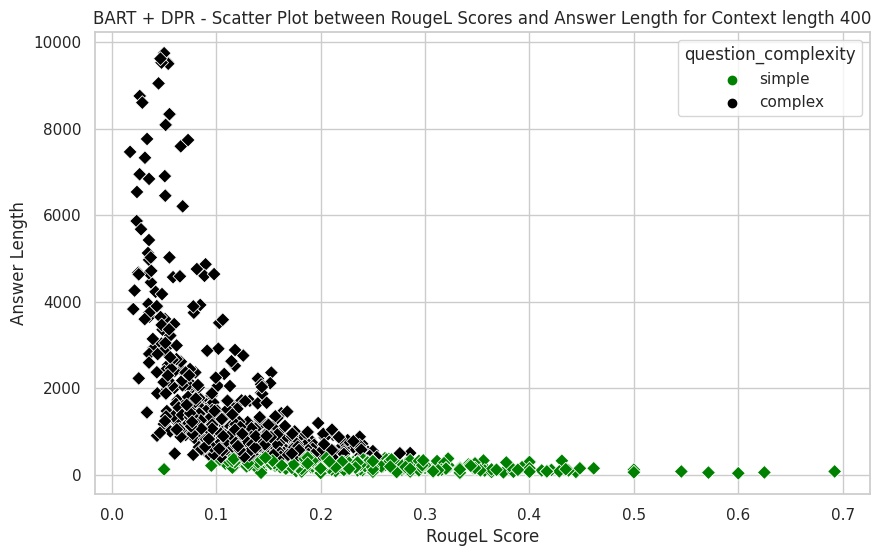

In [187]:
# DPR Bart RougeL scores (diamond)

import seaborn as sns
import matplotlib.pyplot as plt

# Assuming df_test_DPR already contains the 'rougeL_recall_median', 'Ans_length', and 'question_complexity' columns

plt.figure(figsize=(10, 6))
sns.scatterplot(
    x='rougeL_recall_median',
    y='Ans_length',
    data=df_test_DPR[0:1000],
    hue='question_complexity',
    palette={'simple': 'green', 'complex': 'black'},
    marker='D',  # D represents the diamond marker
    s=50  # Marker size, you can adjust this value as needed
)
plt.title('BART + DPR - Scatter Plot between RougeL Scores and Answer Length for Context length 400')
plt.xlabel('RougeL Score')
plt.ylabel('Answer Length')

# Show the plot
plt.show()


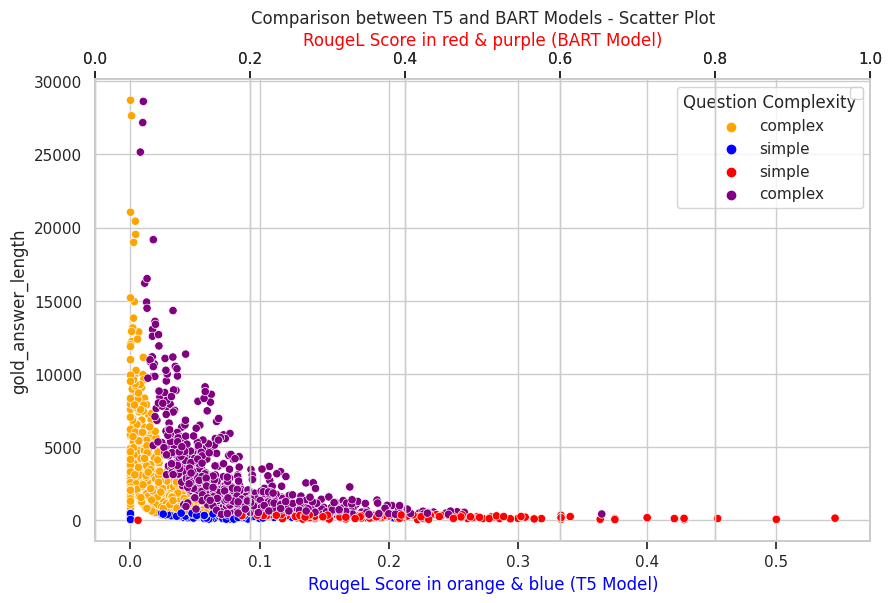

In [188]:
# Comparison between T5 and Bart model for RougeL scores

import seaborn as sns
import matplotlib.pyplot as plt

# Assuming test_df_new contains columns from both T5 and BART models

# Create a dual-axis plot
fig, ax1 = plt.subplots(figsize=(10, 6))

# Scatter plot for T5 model - RougeL scores and answer length
sns.scatterplot(x='rougeL_scores', y='gold_answer_length', data=test_df_new[0:1000], hue='question_complexity', palette={'simple': 'blue', 'complex': 'orange'}, ax=ax1)

# Create a secondary x-axis for T5 model - cosine similarity
ax2 = ax1.twiny()
# sns.scatterplot(x='cosine_similarity_score', y='gold_answer_length', data=test_df_new[0:1000], color='green', marker='+', label='T5 - Cosine Similarity', ax=ax2)

# Scatter plot for BART model - RougeL scores and answer length
sns.scatterplot(x='rougeL_R', y='Ans_length', data=bart_df[0:1000], hue='question_complexity', palette={'simple': 'red', 'complex': 'purple'}, ax=ax1)

# Scatter plot for BART model - cosine similarity
ax3 = ax1.twiny()
# sns.scatterplot(x='Cosine_Sim', y='Ans_length', data=bart_df[0:1000], color='orange', marker='x', label='BART - Cosine Similarity', ax=ax3)

# Set labels for the axes
ax1.set_xlabel('RougeL Score in orange & blue (T5 Model)', color='blue')
# ax2.set_xlabel('Cosine Similarity (T5 Model)', color='green')
ax3.set_xlabel('RougeL Score in red & purple (BART Model)', color='red')

# Place the legend inside the plot area with titles
legend_labels = {'simple': 'T5 - Simple', 'complex': 'T5 - Complex','red': 'BART - Simple question', 'purple': 'BART - Complex question', 'blue': 'T5 - Complex question', 'orange': 'T5 - Simple question'}

ax1.legend(title='Question Complexity', loc='upper right')
#ax2.legend(title='Cosine Similarity', loc='upper right')

# Show the plot
plt.title('Comparison between T5 and BART Models - Scatter Plot')
plt.ylabel('Values')
plt.legend()
plt.show()


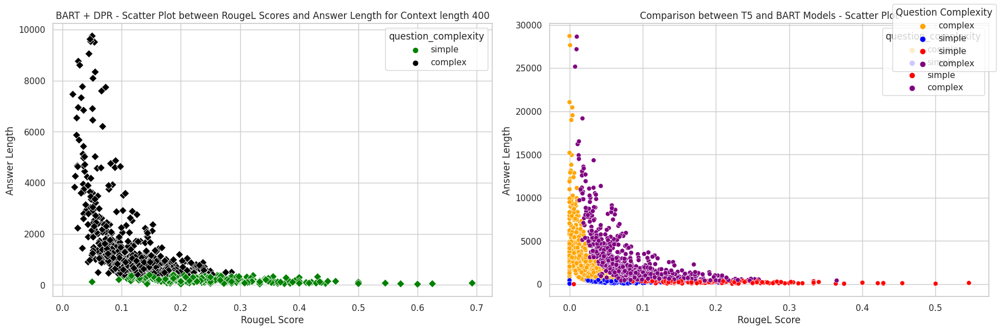

In [190]:
# Comparison between T5 & Bart model and Bart+DPR model

import seaborn as sns
import matplotlib.pyplot as plt

# Assuming df_test_DPR already contains the 'rougeL_recall_median', 'Ans_length', and 'question_complexity' columns
# Assuming test_df_new contains columns from both T5 and BART models

# Create a dual-axis plot
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(18, 6))

# Scatter plot for BART + DPR model
sns.scatterplot(
    x='rougeL_recall_median',
    y='Ans_length',
    data=df_test_DPR[0:1000],
    hue='question_complexity',
    palette={'simple': 'green', 'complex': 'black'},
    marker='D',
    s=50,
    ax=ax1
)
ax1.set_title('BART + DPR - Scatter Plot between RougeL Scores and Answer Length for Context length 400')
ax1.set_xlabel('RougeL Score')
ax1.set_ylabel('Answer Length')

# Scatter plot for T5 and BART models
sns.scatterplot(
    x='rougeL_scores',
    y='gold_answer_length',
    data=test_df_new[0:1000],
    hue='question_complexity',
    palette={'simple': 'blue', 'complex': 'orange'},
    ax=ax2
)

# Scatter plot for BART model - RougeL scores and answer length
sns.scatterplot(
    x='rougeL_R',
    y='Ans_length',
    data=bart_df[0:1000],
    hue='question_complexity',
    palette={'simple': 'red', 'complex': 'purple'},
    ax=ax2
)

ax2.set_title('Comparison between T5 and BART Models - Scatter Plot')
ax2.set_xlabel('RougeL Score')
ax2.set_ylabel('Answer Length')

# Set common legend for both subplots
handles, labels = ax2.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', title='Question Complexity')

# Show the plot
plt.tight_layout()
plt.show()


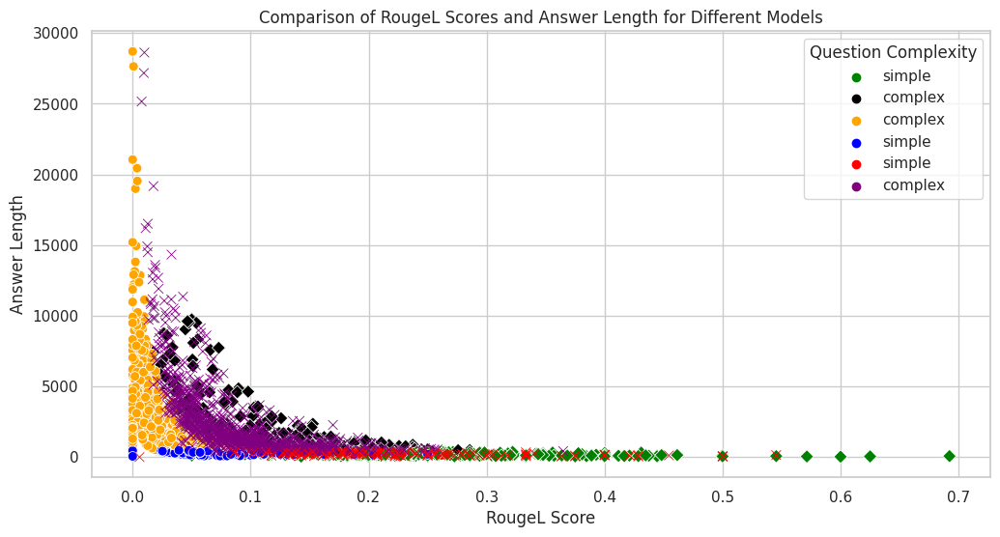

In [193]:
# T5, Bart and Bart+DPR RougeL scores in same graph

import seaborn as sns
import matplotlib.pyplot as plt

# Assuming df_test_DPR already contains the 'rougeL_recall_median', 'Ans_length', and 'question_complexity' columns
# Assuming test_df_new contains columns from both T5 and BART models

plt.figure(figsize=(12, 6))

# Scatter plot for BART + DPR model
sns.scatterplot(
    x='rougeL_recall_median',
    y='Ans_length',
    data=df_test_DPR[0:1000],
    hue='question_complexity',
    palette={'simple': 'green', 'complex': 'black'},
    marker='D',
    s=50
)

# Scatter plot for T5 model
sns.scatterplot(
    x='rougeL_scores',
    y='gold_answer_length',
    data=test_df_new[0:1000],
    hue='question_complexity',
    palette={'simple': 'blue', 'complex': 'orange'},
    marker='o',
    s=50
)

# Scatter plot for BART model
sns.scatterplot(
    x='rougeL_R',
    y='Ans_length',
    data=bart_df[0:1000],
    hue='question_complexity',
    palette={'simple': 'red', 'complex': 'purple'},
    marker='x',
    s=50
)

plt.title('Comparison of RougeL Scores and Answer Length for Different Models')
plt.xlabel('RougeL Score')
plt.ylabel('Answer Length')
plt.legend(title='Question Complexity')

# Show the plot
plt.show()


In [194]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming df_test_DPR, test_df_new, and bart_df have columns 'rougeL_recall_median', 'rougeL_scores', 'rougeL_R', 'Ans_length'

# Create a figure with subplots
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 6), sharey=True)

# Plot histogram for T5 model
sns.histplot(data=test_df_new, x='rougeL_scores', hue='Ground_Ans_length', multiple='stack', bins=20, ax=ax1, palette='viridis')
ax1.set_title('T5 - Distribution of RougeL Scores')
ax1.set_xlabel('RougeL Score')
ax1.set_ylabel('Frequency')

# Plot histogram for BART model
sns.histplot(data=bart_df, x='rougeL_R', hue='Ans_length', multiple='stack', bins=20, ax=ax2, palette='viridis')
ax2.set_title('BART - Distribution of RougeL Scores')
ax2.set_xlabel('RougeL Score')
ax2.set_ylabel('Frequency')

# Plot histogram for DPR model
sns.histplot(data=df_test_DPR, x='rougeL_recall_median', hue='Ans_length', multiple='stack', bins=20, ax=ax3, palette='viridis')
ax3.set_title('DPR - Distribution of RougeL Scores')
ax3.set_xlabel('RougeL Score')
ax3.set_ylabel('Frequency')

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()


<ipython-input-194-2884ecb96388>:28: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming df_test_DPR, test_df_new, and bart_df have columns 'rougeL_recall_median', 'rougeL_scores', 'rougeL_R', 'Ans_length', 'question_complexity'

# Combine the data from all three models
combined_data = pd.concat([
    test_df_new[['rougeL_scores', 'Ground_Ans_length', 'question_complexity']],
    bart_df[['rougeL_R', 'Ans_length', 'question_complexity']],
    df_test_DPR[['rougeL_recall_median', 'Ans_length', 'question_complexity']]
], keys=['T5', 'BART', 'DPR'])

# Create a bar plot
plt.figure(figsize=(14, 8))
sns.barplot(x='Ans_length', y=combined_data.index.get_level_values(0), hue='question_complexity', data=combined_data, palette='viridis')

plt.title('Rouge Scores for T5, BART, and DPR Across Answer Lengths')
plt.xlabel('Answer Length')
plt.ylabel('Rouge Score')
plt.legend(title='Question Complexity')

# Show the plot
plt.show()
